In [1]:
# Importing necessary Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import statsmodels.api as sm
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 200
sns.set_theme(style='darkgrid')

In [2]:
# Imprting the Dataset

df = pd.read_csv('AAPL.csv', parse_dates=['Date'])
df

,Date,Open,High,Low,Close,Adj Close,Volume
0,03-01-2012,58.485714,58.928570,58.428570,58.747143,50.765709,75555200
1,04-01-2012,58.571430,59.240002,58.468571,59.062859,51.038536,65005500
2,05-01-2012,59.278572,59.792858,58.952858,59.718571,51.605175,67817400
3,06-01-2012,59.967144,60.392857,59.888573,60.342857,52.144630,79573200
4,09-01-2012,60.785713,61.107143,60.192856,60.247143,52.061932,98506100
...,...,...,...,...,...,...,...
2006,23-12-2019,280.529999,284.250000,280.369995,284.000000,282.054138,24643000
2007,24-12-2019,284.690002,284.890015,282.920013,284.269989,282.322266,12119700
2008,26-12-2019,284.820007,289.980011,284.700012,289.910004,287.923645,23280300
2009,27-12-2019,291.119995,293.970001,288.119995,289.799988,287.814392,36566500


## 📊 Descriptive Statistics

In [3]:
# Statistical Summary

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2011 entries, 0 to 2010
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2011 non-null   object 
 1   Open       2011 non-null   float64
 2   High       2011 non-null   float64
 3   Low        2011 non-null   float64
 4   Close      2011 non-null   float64
 5   Adj Close  2011 non-null   float64
 6   Volume     2011 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 110.1+ KB


In [4]:
# Descriptive Statistics

df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2.011000e+03
mean,126.707469,127.827594,125.580258,126.741235,119.505548,5.949670e+07
std,50.483753,50.926301,50.124940,50.578369,52.438444,4.683856e+07
min,55.424286,57.085712,55.014286,55.790001,48.921928,1.136200e+07
25%,85.882858,86.717858,85.056427,86.202145,75.056679,2.758565e+07
50%,113.050003,114.190002,111.870003,113.050003,105.222908,4.346900e+07
75%,165.190002,167.409996,163.424995,165.245002,160.047111,7.471030e+07
max,291.119995,293.970001,288.119995,291.519989,289.522614,3.765300e+08


In [5]:
# Convert date column for proper time series analysis

df['Date'] = pd.to_datetime(df['Date'], dayfirst=True, errors='coerce')
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2012-01-03,58.485714,58.928570,58.428570,58.747143,50.765709,75555200
1,2012-01-04,58.571430,59.240002,58.468571,59.062859,51.038536,65005500
2,2012-01-05,59.278572,59.792858,58.952858,59.718571,51.605175,67817400
3,2012-01-06,59.967144,60.392857,59.888573,60.342857,52.144630,79573200
4,2012-01-09,60.785713,61.107143,60.192856,60.247143,52.061932,98506100


In [6]:
# Maximum values

df.max()

Date         2019-12-30 00:00:00
Open                  291.119995
High                  293.970001
Low                   288.119995
Close                 291.519989
Adj Close             289.522614
Volume                 376530000
dtype: object

In [7]:
# Minimum values

df.min()

Date         2012-01-03 00:00:00
Open                   55.424286
High                   57.085712
Low                    55.014286
Close                  55.790001
Adj Close              48.921928
Volume                  11362000
dtype: object

In [8]:
# Checking duplicates

df.duplicated().sum()

0

In [9]:
# Checking missing values

df.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

# 📈 Data Visualizations

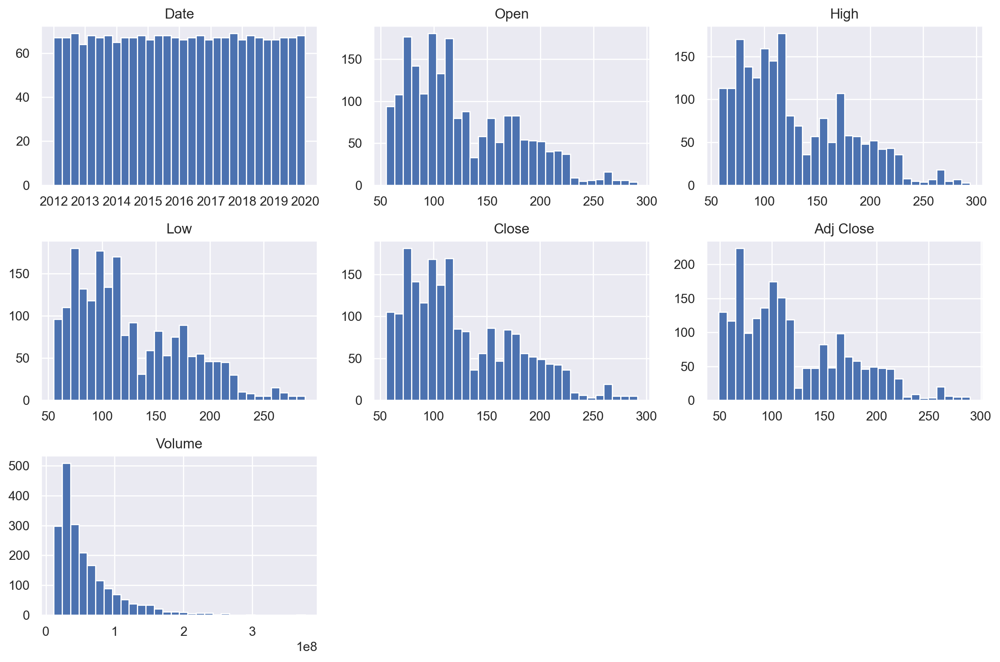

In [10]:
# Histograms

df.hist(bins = 30)
plt.tight_layout()

- Every column is Skewed, mostly right skewed.

<Axes: >

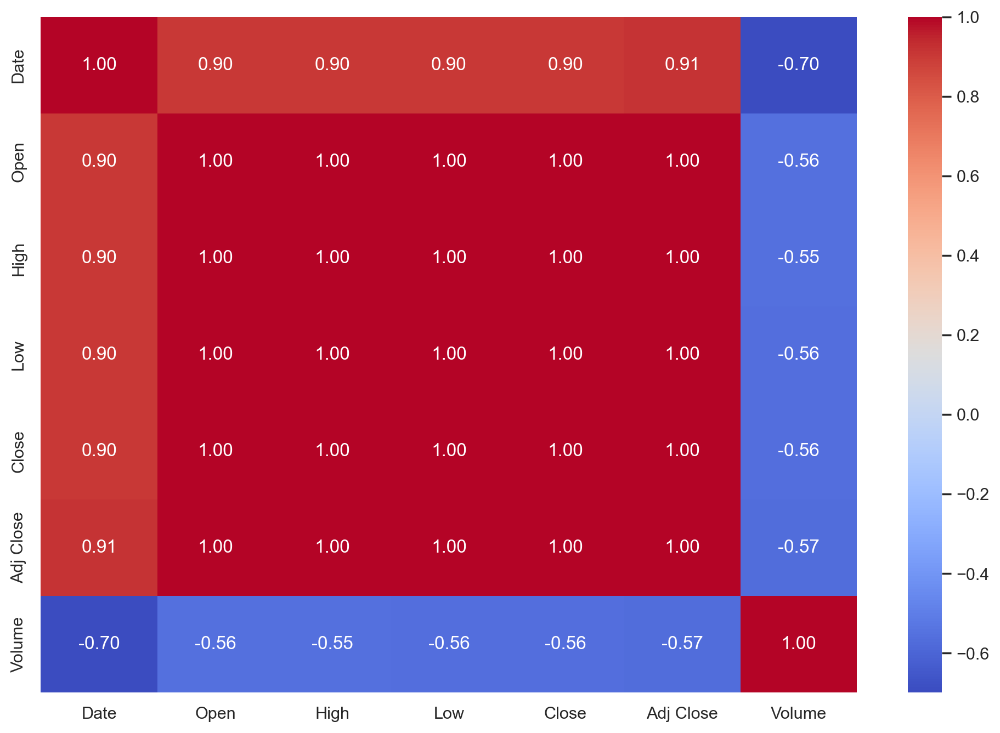

In [11]:
# Heatmap for co-relations between features

sns.heatmap(df.corr(), annot = True, fmt = '.2f', cmap = 'coolwarm')

### Interpretation of the Heatmap

This heatmap, generated using the **Seaborn library**, visually represents the correlation between different numerical features in the dataset. The intensity of the colors indicates the strength of the relationships between variables.

#### **Key Observations**
1. **Diagonal Values (Perfect Correlation)**  
   - The diagonal cells show **self-correlations**, meaning each variable is always 100% correlated with itself.


2. **Color Scale and Strength of Correlation**  
   - **Darker shades** (closer to 1.0) indicate **strong positive correlations** (as one variable increases, the other tends to increase).  
   - **Lighter shades** (closer to -1.0) indicate **strong negative correlations** (as one variable increases, the other tends to decrease).  
   - **Near-zero values** indicate **weak or no correlation** between variables.


3. **Identifying Highly Correlated Features**  
   - Strong correlations between features might suggest **multicollinearity**, which can impact predictive models.  
   - If features are highly correlated (e.g., **Open vs. Close price** in stock market data), one might be redundant for modeling.


4. **Applications of Heatmap Insights**  
   - Helps in **feature selection** for machine learning.  
   - Identifies **relationships between financial indicators**.  
   - Supports decisions like **dimensionality reduction** (removing redundant variables).

### Next Steps  
- Consider removing or transforming **highly correlated features** to improve model stability.  
- If working on stock market analysis, explore **rolling correlations** or sector-wide patterns.

<Axes: xlabel='Adj Close', ylabel='Close'>

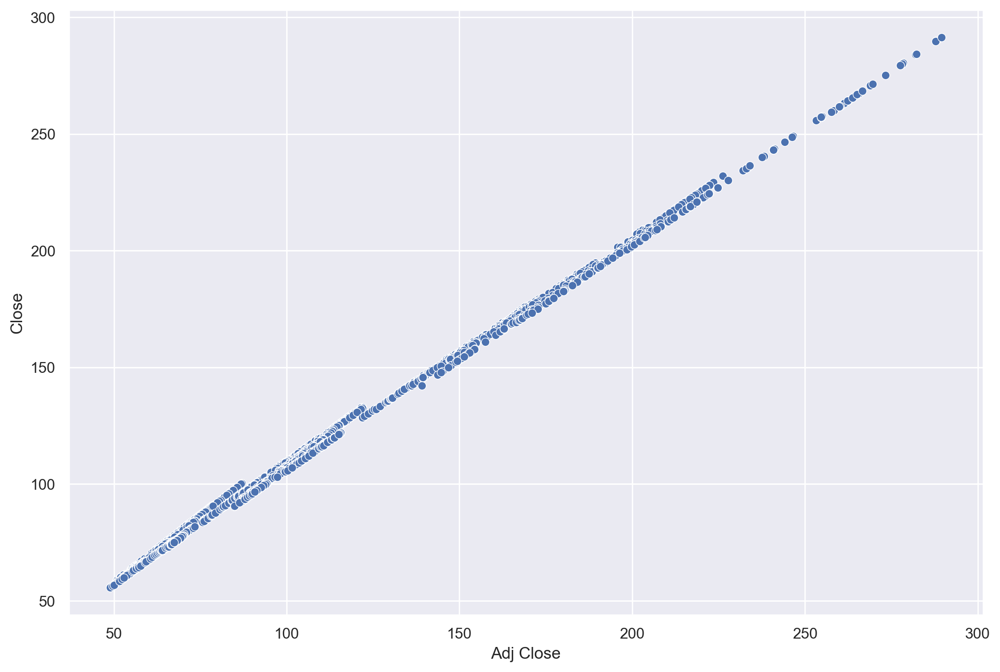

In [12]:
# Scatter Plot

sns.scatterplot(x = df['Adj Close'], y = df['Close'], palette ='coolwarm')

<Axes: xlabel='Open', ylabel='Close'>

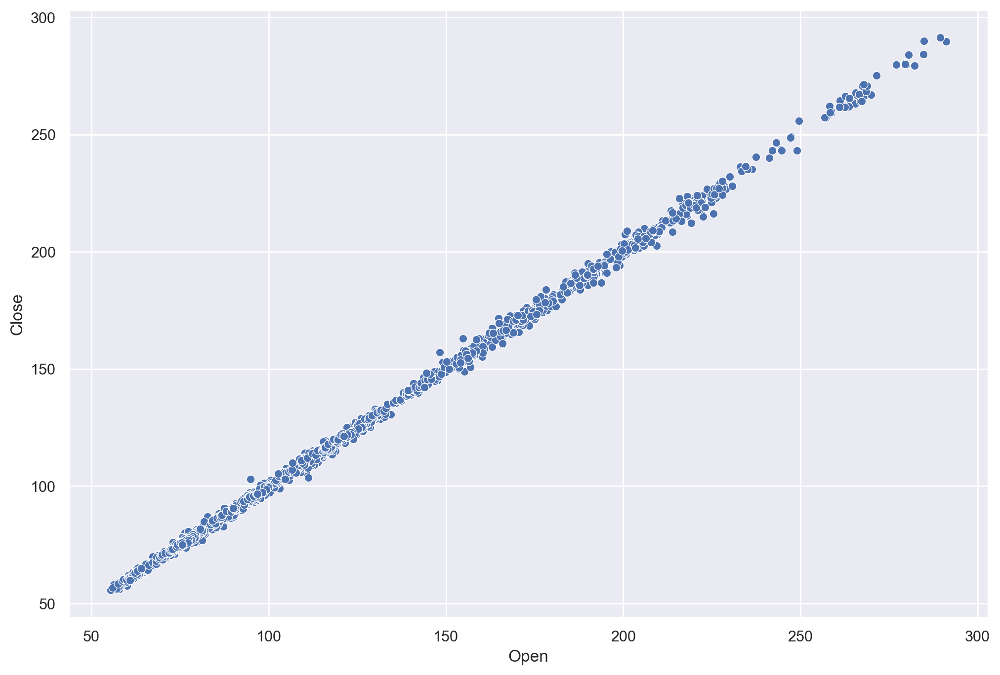

In [13]:
# Scatter Plot

sns.scatterplot(x = df['Open'], y = df['Close'], palette ='coolwarm')

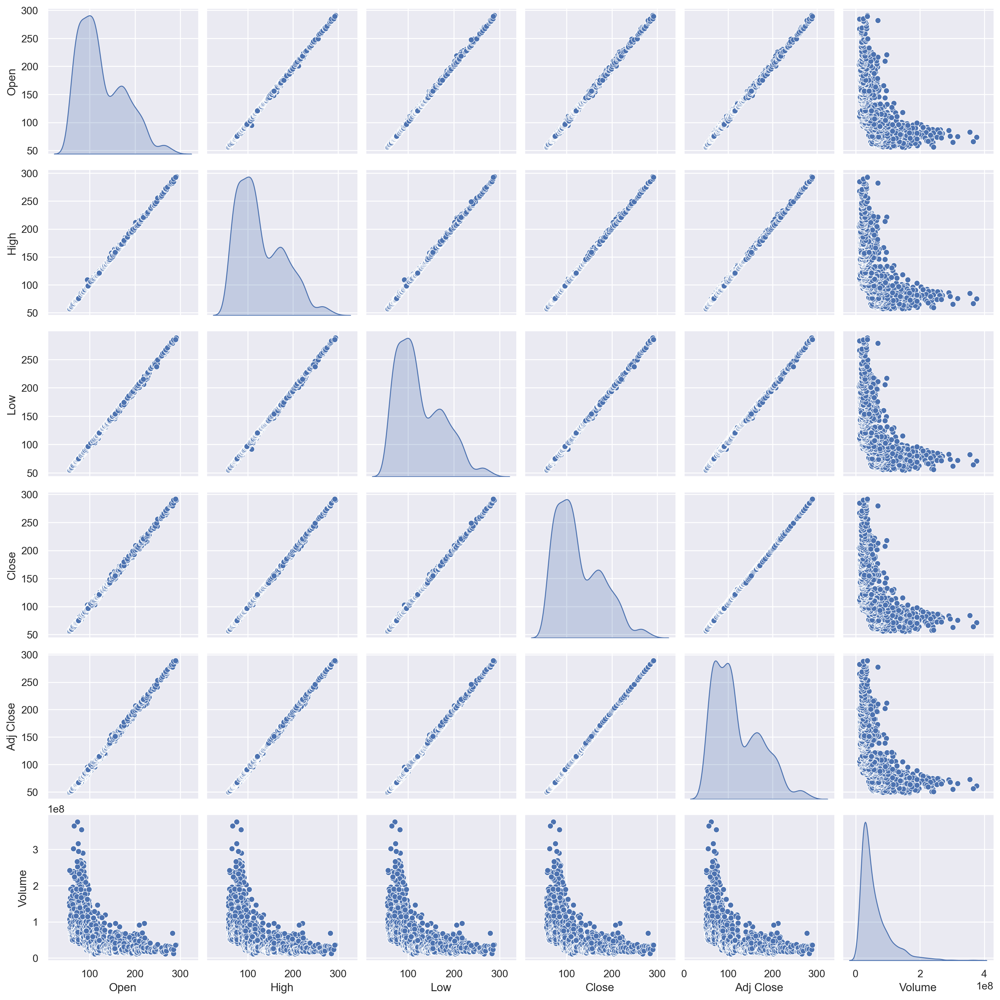

In [14]:
# Pairplot

sns.pairplot(df, diag_kind = 'kde', palette = 'coolwarm')

Text(0, 0.5, 'Price')

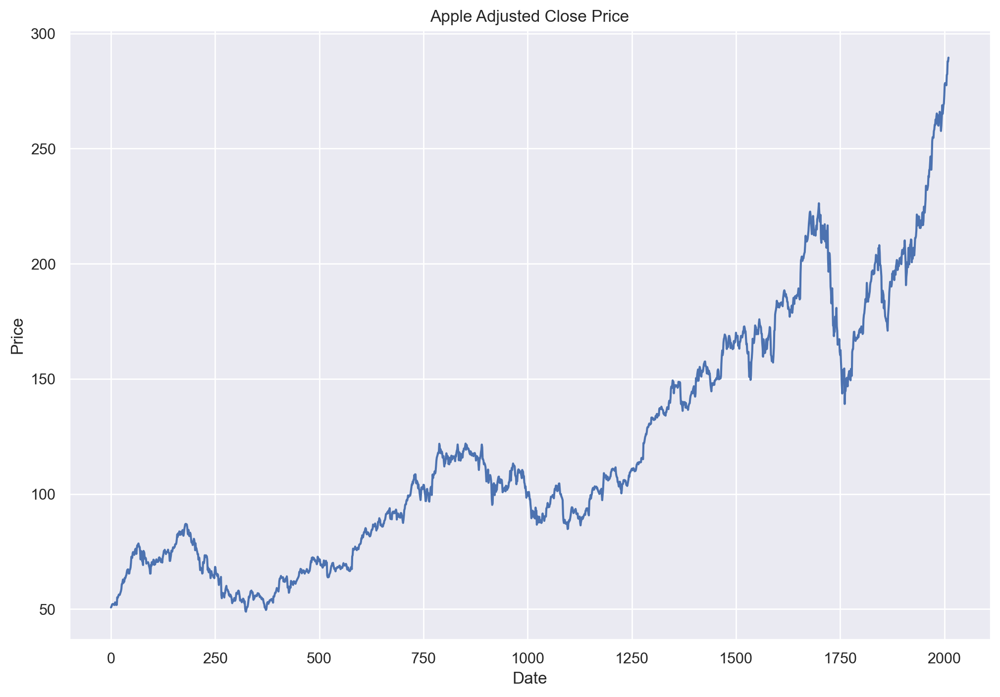

In [15]:
# Line Plot

plt.plot(df['Adj Close'], label = 'Adj Close Price')
plt.title('Apple Adjusted Close Price')
plt.xlabel('Date')
plt.ylabel('Price')

## 📉 Trend, Seasonality, Residuals

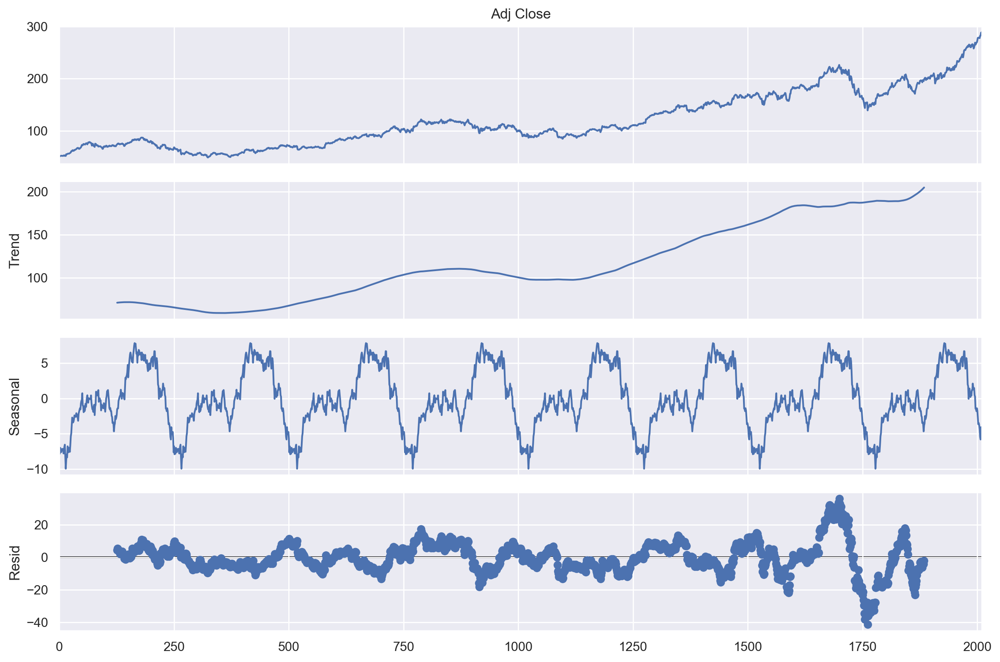

In [16]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(df['Adj Close'], model='additive', period=252)
result.plot()
plt.show()

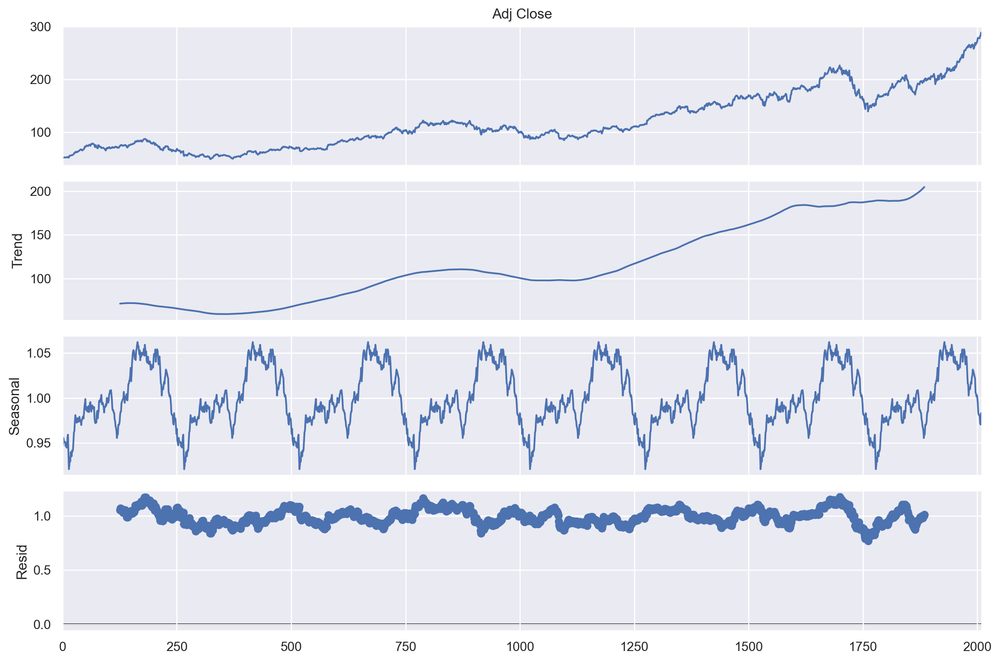

In [17]:
result2 = seasonal_decompose(df['Adj Close'], model='multiplicative', period=252)
result2.plot()
plt.show()

### Interpretation of the Graph

This graph displays the **decomposition of a time series dataset**, breaking it down into its core components to better understand the underlying patterns in stock price movements.

1. **Observed Data (Adj Close)**  
   - The top subplot represents the adjusted closing price of Apple stock over time.
   - The trend suggests **fluctuations with possible growth**, alongside recurring patterns.

2. **Trend Component**  
   - The second subplot showcases the **long-term movement** in stock prices.
   - It smooths out short-term fluctuations, revealing an overall **upward trend towards later years**.

3. **Seasonal Component**  
   - The third subplot captures the **recurring short-term cycles** in stock prices.
   - Peaks and troughs indicate periodic fluctuations, possibly due to **market trends, earnings reports, or macroeconomic factors**.

4. **Residual Component**  
   - The bottom subplot visualizes the **remaining variations** after removing the trend and seasonal influences.
   - The residuals appear centered around zero, signifying **random noise or external events affecting price movements**.

### Insights  
- **Trend analysis** can help predict future stock performance.  
- **Seasonality detection** may inform better entry or exit points for trades.  
- **Residual component analysis** can highlight anomalies or external shocks.

This decomposition technique enhances **financial modeling, forecasting, and investment strategy development**.

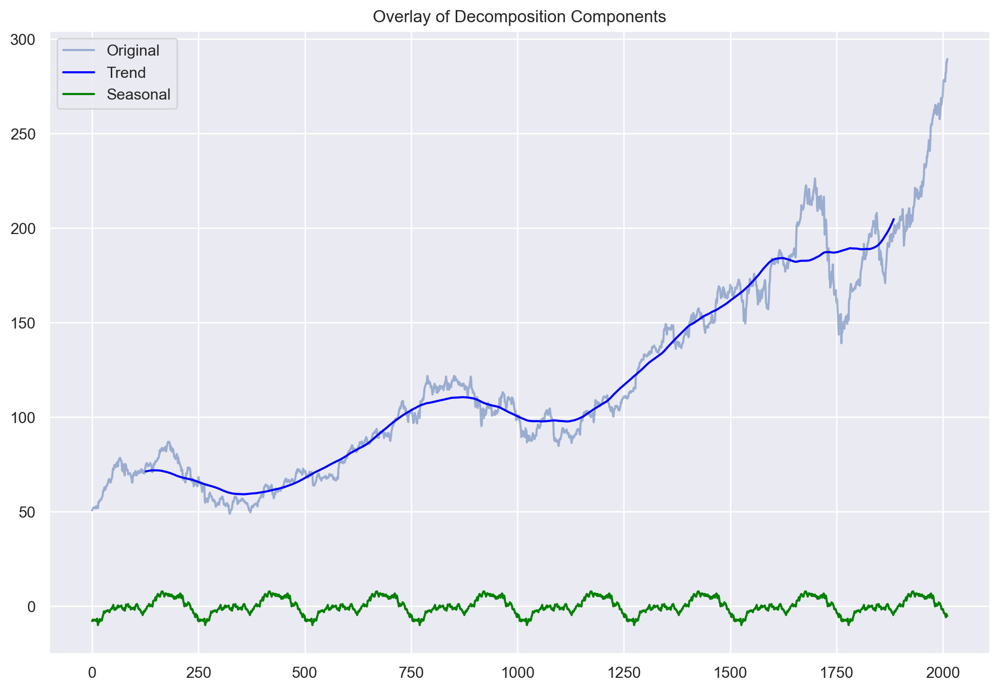

In [18]:
plt.plot(df['Adj Close'], label='Original', alpha=0.5)
plt.plot(result.trend, label='Trend', color='blue')
plt.plot(result.seasonal, label='Seasonal', color='green')
plt.legend()
plt.title("Overlay of Decomposition Components")
plt.show()

### 🧠 **Interpretation: Time Series Decomposition (Overlay Plot)**

#### 1. **Original Series (Pink Line)**

* Represents the **actual Adjusted Close Price** of Apple over time.
* You can clearly see an **upward trend** with periodic fluctuations.
* The price increased **gradually** at first and then more **sharply post-1500 index**, indicating a **strong bullish trend** in recent years.

#### 2. **Trend Component (Blue Line)**

* Smooth line capturing the **long-term direction** of the stock price.
* Clearly shows:

  * **Uptrend** after a dip around index \~500.
  * Slope becomes **steeper after 1250**, suggesting **accelerated growth**.
  * Reflects macroeconomic/market factors like increased investor interest or strong earnings performance.
* The trend line helps de-noise short-term movements and gives a clearer idea of overall momentum.

#### 3. **Seasonal Component (Green Line)**

* Captures **repetitive cyclical behavior**, likely on an **annual basis** (since `period=252` assumes daily stock data with \~252 trading days/year).
* You can observe:

  * Regular ups and downs — these **seasonal fluctuations** could correspond to known **market cycles**, such as:

    * Q4 earnings
    * Holiday season demand
    * Tech product release patterns (Apple launches, etc.)
  * The amplitude (height) of the seasonality is **consistent** — suggesting stable seasonal behavior.

---

### 🔍 Insights:

* **Long-Term Investor View**: The strong upward trend confirms Apple as a good long-term performer.
* **Tactical Trading View**: The seasonal component reveals potential **timing opportunities** — e.g., enter before seasonal upticks, exit before dips.
* **Modeling Perspective**:

  * The decomposition justifies the use of **SARIMA/SARIMAX**, as both trend and seasonality exist.
  * The stable seasonality supports **additive decomposition**, though multiplicative might also be explored if variance increases with the level.

In [19]:
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2012-01-03,58.485714,58.928570,58.428570,58.747143,50.765709,75555200
1,2012-01-04,58.571430,59.240002,58.468571,59.062859,51.038536,65005500
2,2012-01-05,59.278572,59.792858,58.952858,59.718571,51.605175,67817400
3,2012-01-06,59.967144,60.392857,59.888573,60.342857,52.144630,79573200
4,2012-01-09,60.785713,61.107143,60.192856,60.247143,52.061932,98506100


## 🛠 Feature Engineering

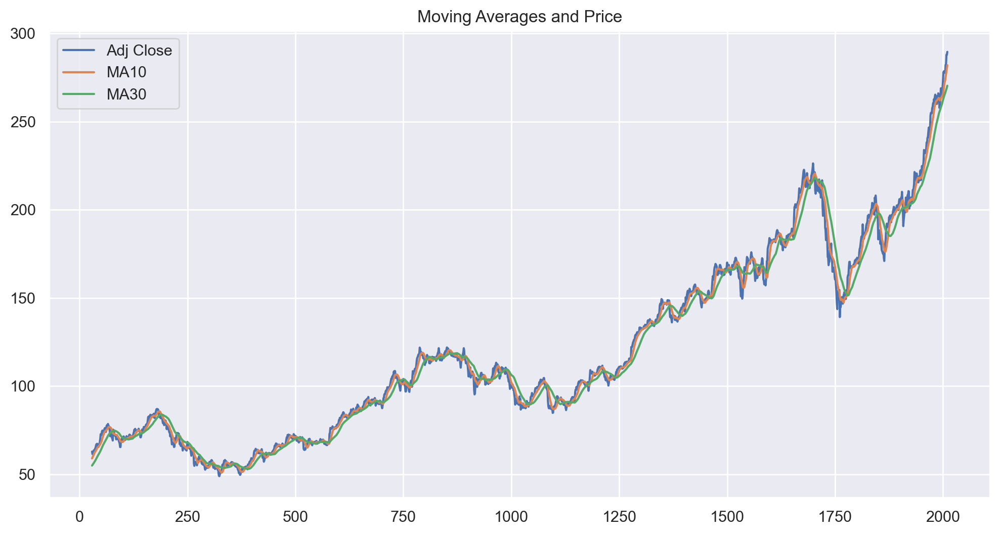

In [20]:
df['MA10'] = df['Adj Close'].rolling(window=10).mean()
df['MA30'] = df['Adj Close'].rolling(window=30).mean()
df['Lag1'] = df['Adj Close'].shift(1)
df.dropna(inplace=True)
df[['Adj Close', 'MA10', 'MA30']].plot(figsize=(12, 6))
plt.title('Moving Averages and Price')
plt.show()

In [21]:
df.tail()

,Date,Open,High,Low,Close,Adj Close,Volume,MA10,MA30,Lag1
2006,2019-12-23,280.529999,284.250000,280.369995,284.000000,282.054138,24643000,275.035565,266.860296,277.525391
2007,2019-12-24,284.690002,284.890015,282.920013,284.269989,282.322266,12119700,276.603742,267.590921,282.054138
2008,2019-12-26,284.820007,289.980011,284.700012,289.910004,287.923645,23280300,278.504627,268.516205,282.322266
2009,2019-12-27,291.119995,293.970001,288.119995,289.799988,287.814392,36566500,280.326059,269.354753,287.923645
2010,2019-12-30,289.459991,292.690002,285.220001,291.519989,289.522614,36028600,281.951843,270.310824,287.814392


### Explanation of the Code

This code is designed to **analyze and visualize stock price trends** by incorporating moving averages and lagged values.

1. **Calculating Moving Averages**  
   - `df['MA10'] = df['Adj Close'].rolling(window=10).mean()`  
   - `df['MA30'] = df['Adj Close'].rolling(window=30).mean()`  
   - These lines compute the **10-day and 30-day moving averages**, smoothing stock price fluctuations.
   - Shorter moving averages (e.g., 10-day) react **faster** to price changes, while longer ones (e.g., 30-day) provide **broader trends**.

2. **Shifting Values for Lag Analysis**  
   - `df['Lag1'] = df['Adj Close'].shift(1)`  
   - This introduces a **1-day lag**, aligning today's price with the previous day's closing price.
   - Useful for **predictive modeling** and analyzing price momentum.

3. **Handling Missing Data**  
   - `df.dropna(inplace=True)`  
   - Ensures that any **NaN values** (especially those introduced by rolling averages) are removed for clean analysis.

4. **Visualizing Price & Moving Averages**  
   - `df[['Adj Close', 'MA10', 'MA30']].plot(figsize=(12, 6))`  
   - Plots **actual stock prices** alongside **moving averages** to identify trends.
   - Helps traders spot **crossovers**, which can signal buying or selling opportunities.

5. **Adding Title to the Graph**  
   - `plt.title('Moving Averages and Price')`  
   - Labels the graph for clarity.

### Insights  
- **Moving averages smooth volatility**, helping traders assess trends.  
- **Lagged values aid in forecasting** short-term price movements.  
- **Crossovers between short and long moving averages** can signal trend reversals.  

This technique is widely used in **algorithmic trading, stock analysis, and financial forecasting**. 🚀 Let me know if you'd like to explore **trend detection or predictive modeling** further!

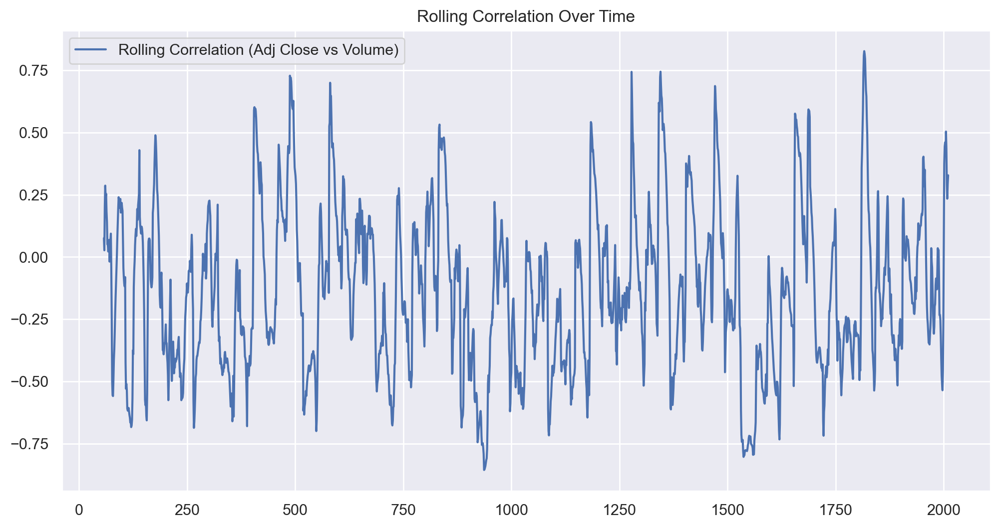

In [22]:
# Compute rolling correlation directly
rolling_corr_30 = df['Adj Close'].rolling(window=30).corr(df['Volume'])

# Plot without adding it as a dataset column
plt.figure(figsize=(12, 6))
plt.plot(rolling_corr_30, label='Rolling Correlation (Adj Close vs Volume)')
plt.title('Rolling Correlation Over Time')
plt.legend()
plt.show()

# Interpreting the Graph
- The curve represents the rolling correlation calculated over a moving window (likely 30 days).

- Fluctuations in correlation indicate that the relationship between price and volume is not constant over time.

- When correlation is high (near +1.0), price and volume move together (increasing volume supports price changes).

- When correlation is negative (near -1.0), price tends to fall when volume rises.

- When correlation hovers around 0, there is weak or no relationship between the two factors.

# Possible Insights
- Sudden drops in correlation could suggest external events, such as earnings releases or macroeconomic shifts.

- If correlation remains strong and positive, trading strategies relying on volume trends might be useful.

- If it's volatile, traders may need adaptive strategies that adjust to changing dynamics.

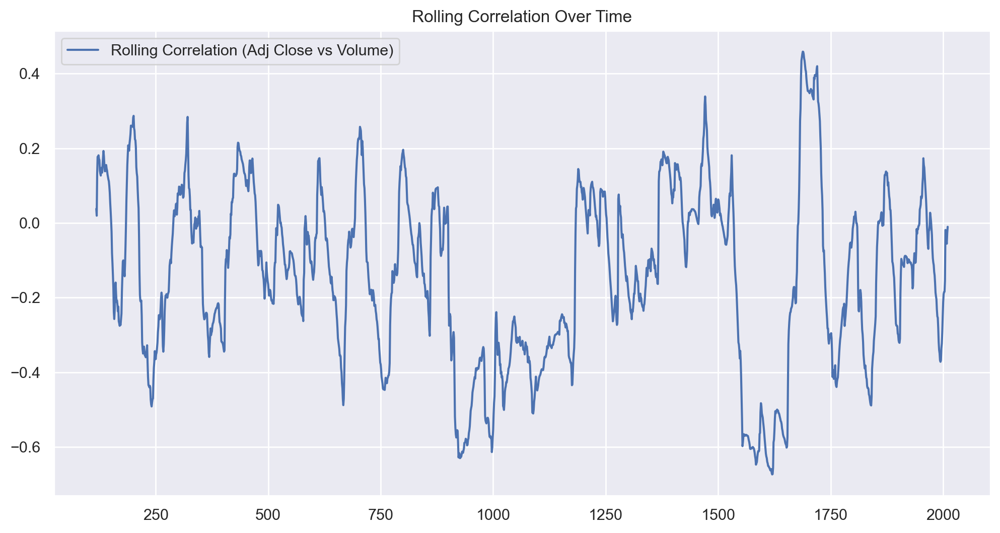

In [23]:
# Compute rolling correlation directly
rolling_corr_90 = df['Adj Close'].rolling(window=90).corr(df['Volume'])

# Plot without adding it as a dataset column
plt.figure(figsize=(12, 6))
plt.plot(rolling_corr_90, label='Rolling Correlation (Adj Close vs Volume)')
plt.title('Rolling Correlation Over Time')
plt.legend()
plt.show()

In [24]:
df['Returns'] = df['Adj Close'].pct_change()
df['Volatility'] = df['Returns'].rolling(window=21).std()
df['Lag2'] = df['Adj Close'].shift(2)
df['Lag3'] = df['Adj Close'].shift(3)

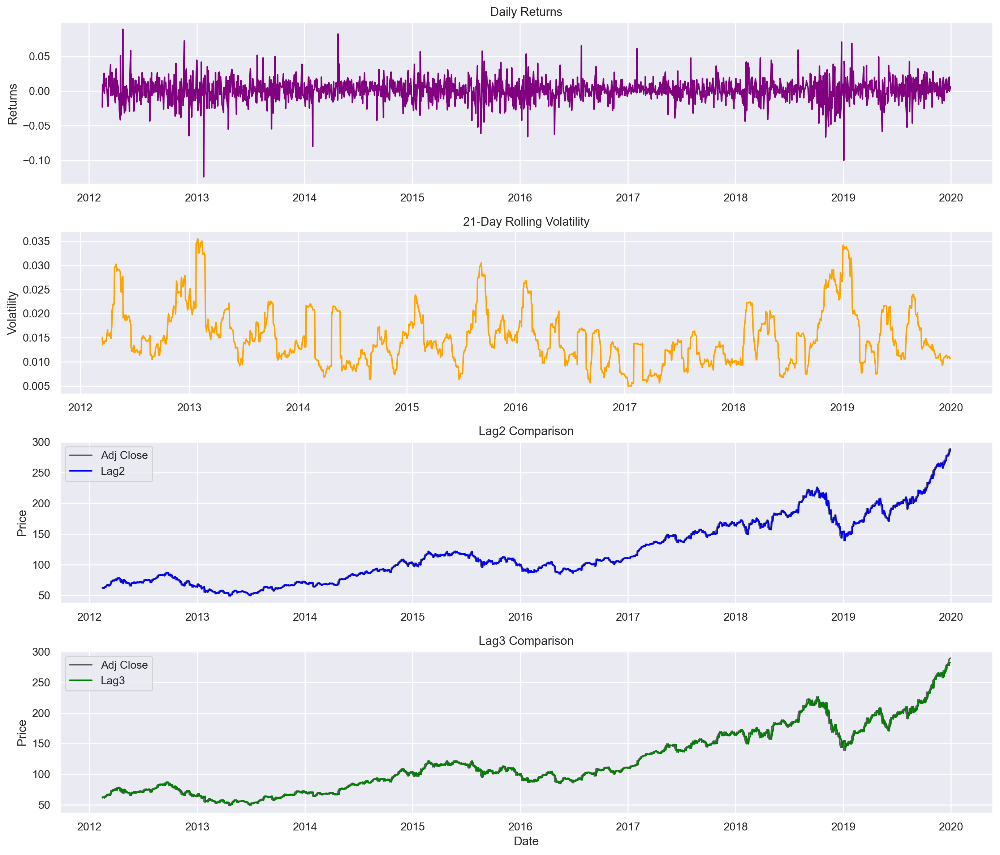

In [25]:
# Set figure size and style
plt.figure(figsize=(14, 12))

# 1. Daily Returns Plot
plt.subplot(4, 1, 1)
plt.plot(df['Date'], df['Returns'], color='purple')
plt.title('Daily Returns')
plt.ylabel('Returns')

# 2. 21-Day Rolling Volatility
plt.subplot(4, 1, 2)
plt.plot(df['Date'], df['Volatility'], color='orange')
plt.title('21-Day Rolling Volatility')
plt.ylabel('Volatility')

# 3. Lag 2 vs Actual
plt.subplot(4, 1, 3)
plt.plot(df['Date'], df['Adj Close'], label='Adj Close', color='black', alpha=0.6)
plt.plot(df['Date'], df['Lag2'], label='Lag2', color='blue')
plt.title('Lag2 Comparison')
plt.ylabel('Price')
plt.legend()

# 4. Lag 3 vs Actual
plt.subplot(4, 1, 4)
plt.plot(df['Date'], df['Adj Close'], label='Adj Close', color='black', alpha=0.6)
plt.plot(df['Date'], df['Lag3'], label='Lag3', color='green')
plt.title('Lag3 Comparison')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()

plt.tight_layout()
plt.show()

- Returns Plot shows volatility spikes (e.g., earnings releases or market-wide events).

- Rolling Volatility helps identify periods of high-risk vs low-risk movement.

- Lag2 & Lag3 plots show how past prices relate to the current price — useful for time series regression or XGBoost input features.

## 🧠 Why These Features Were Selected

To provide the models with meaningful signals for forecasting, we engineered the following features. Each plays a specific role in capturing stock behavior:

---

### 🔁 Lag Features
- **Lag1, Lag2, Lag3**:
  - Represent the closing prices from the past 1, 2, and 3 days.
  - Provide short-term memory for traditional ML models like Linear Regression, SVR, etc.
  - Help detect recent patterns like uptrends, downtrends, or reversals.

---

### 📉 Returns
- Calculated as the **daily percentage change** in adjusted closing price.
- Captures the momentum or velocity of price movement.
- Essential for identifying price spikes or dips that raw prices may not reveal.

---

### 📊 Volatility (21-day)
- Computed as the **21-day rolling standard deviation** of returns.
- Measures the riskiness or variability in price movements.
- Helps distinguish between calm periods and turbulent ones.

---

### 📈 Moving Averages
- **MA10**: 10-day simple moving average of closing price.
  - Captures **short-term trend direction** and smooths out noise.
- **MA30**: 30-day moving average.
  - Represents the **medium-term trend** and helps identify crossovers (bullish or bearish momentum).

---

> ✅ These features empower models to learn from **price memory (lags)**, **momentum (returns)**, **market volatility**, and **trend signals (moving averages)** — offering a holistic view of stock behavior for better forecasting accuracy.

# ACF & PACF Plots (Auto & Partial Auto Co-relation Function)

<Figure size 2400x1000 with 0 Axes>

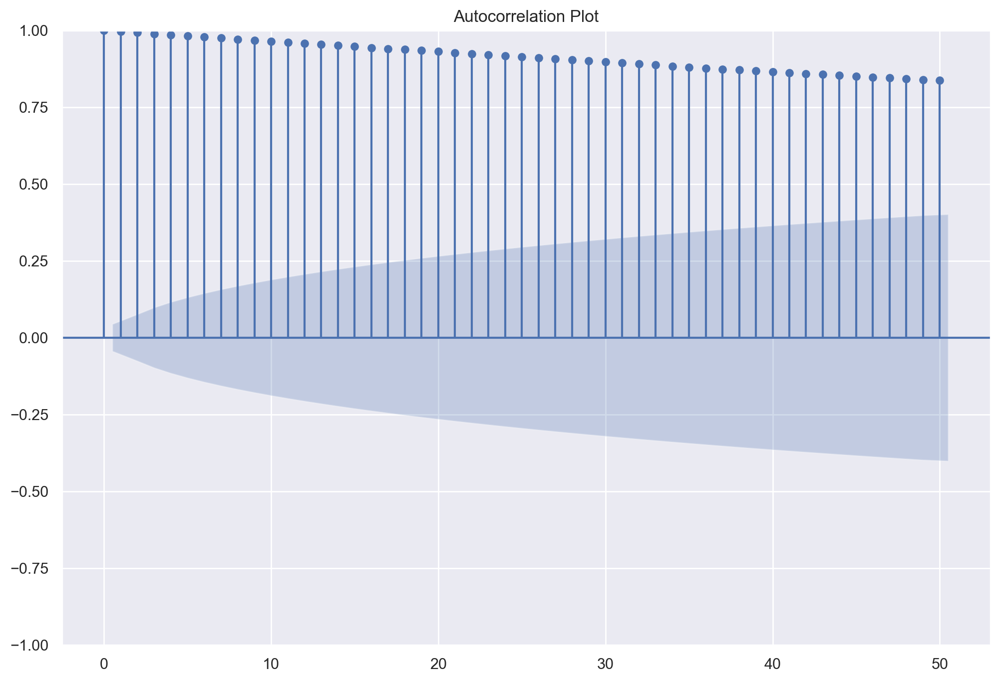

<Figure size 2400x1000 with 0 Axes>

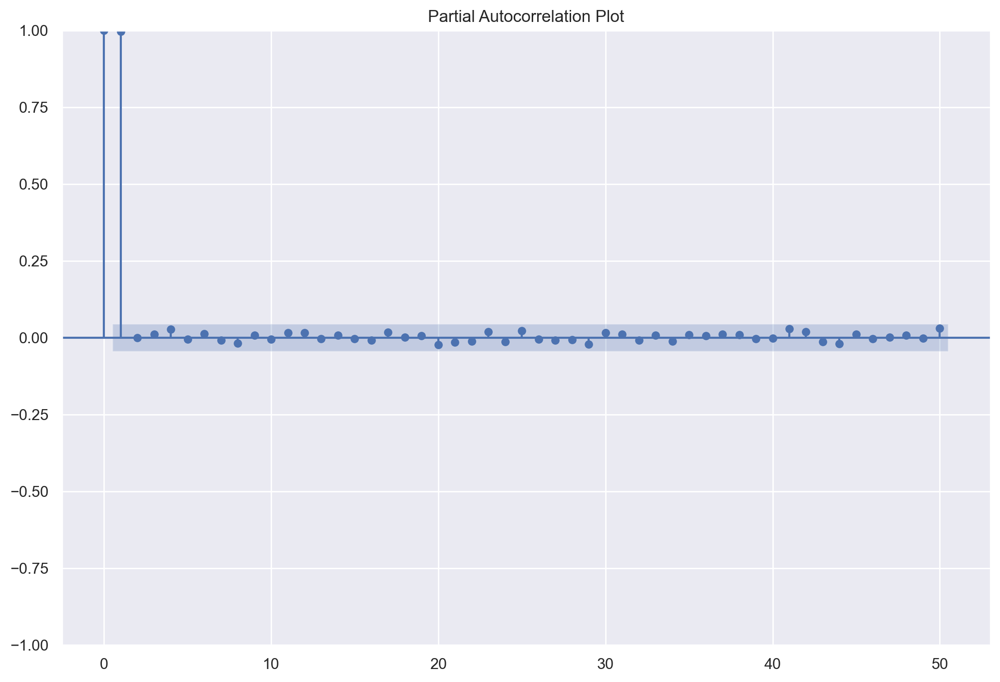

In [26]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plt.figure(figsize=(12, 5))
plot_acf(df['Close'].dropna(), lags=50)
plt.title('Autocorrelation Plot')
plt.show()

plt.figure(figsize=(12, 5))
plot_pacf(df['Close'].dropna(), lags=50)
plt.title('Partial Autocorrelation Plot')
plt.show()

# ACF Plot - Interpretation

- Autocorrelation Function (ACF): The plot represents how past values of the dataset influence future values.

- Y-Axis (Autocorrelation Values): Ranges from -1 to 1, showing the correlation strength.

- X-Axis (Lag Values): Indicates different time lags.

- Blue Vertical Lines: Represent autocorrelation values at different lags.

- Shaded Confidence Interval: Helps determine statistical significance of autocorrelations.

- Observation: Autocorrelation values remain high, suggesting strong correlation over multiple time lags.

- Potential Insight: The dataset may exhibit a trend or seasonality, requiring differencing or transformation for modeling.

# PACF Plot - Interpretation

- Partial Autocorrelation Function (PACF): Measures the direct relationship between a time series and its past values while removing the effect of intermediate lags.

- Y-Axis (Partial Autocorrelation Values): Ranges from -1 to 1, showing the strength of correlation.

- X-Axis (Lag Values): Indicates the different time lags.

- Significant Spikes: High values at lag 1 and lag 2 suggest strong partial autocorrelation at these lags.

- Near-Zero Values for Other Lags: Implies that further lags do not significantly contribute to the model once the primary lags are accounted for.

- Application: Helps in identifying relevant lag values for AR models in time series forecasting.

- Modeling Insight: This pattern suggests an autoregressive (AR) structure—typically useful for ARIMA modeling.

In [27]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Candlestick(
                x=df.index,
                open=df['Open'],
                high=df['High'],
                low=df['Low'],
                close=df['Close'])])

fig.update_layout(title='AAPL Candlestick Chart', xaxis_title='Date', yaxis_title='Price')
fig.show()

# AAPL CandleStick Chart - Interpretation

- Candlestick Representation: The chart visualizes AAPL stock price fluctuations over time.

- X-Axis (Date): Represents different trading days.

- Y-Axis (Price): Displays stock price movements.

- Green Candlesticks: Indicate an increase in stock price on that day.

- Red Candlesticks: Indicate a decrease in stock price.

- Trend Observation: General upward trajectory, suggesting an overall bullish trend.

- Periods of Volatility: Fluctuations in candlestick size indicate high trading activity and price uncertainty.

- Smaller Overview Chart: Likely serves as a summary to provide a broader time frame perspective.

- Analysis Insight: Useful for identifying trends, resistance/support levels, and making trading decisions.

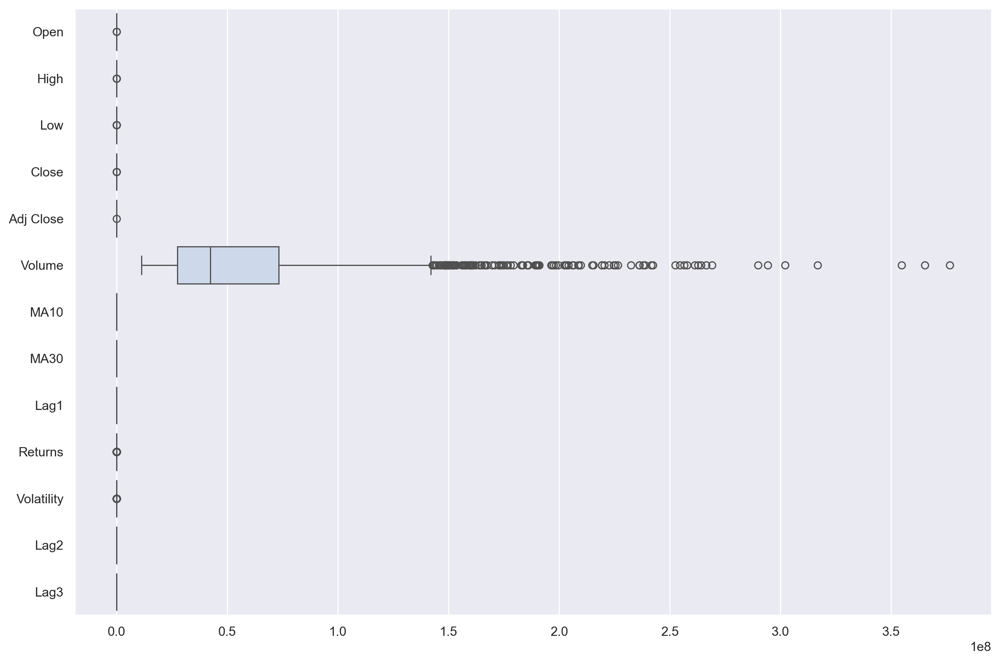

In [28]:
sns.boxplot(df, palette = 'coolwarm', orient = 'h')
plt.tight_layout()

In [29]:
df['Volume'].nunique()

1977

In [30]:
df['Volume'].max()

376530000

# Performing Stationarity Test

- Checking if the Dataset is Stationary or not.

# ADF Test

**Null Hypothesis (H0):** The time series has a unit root (non-stationary). 

**Alternative Hypothesis (H1):** The time series is stationary.

- The ADF statistic is positive and very close to zero.

- The p-value is extremely high (0.996), which is much greater than any typical significance level.

- The ADF statistic is significantly greater than all critical values.

Therefore, we fail to reject the null hypothesis.

In [31]:
from statsmodels.tsa.stattools import adfuller

# Perform the Augmented Dickey-Fuller test
adf_test = adfuller(df['Close'])

print('ADF Test Results:')
print(f'ADF Statistic: {round(adf_test[0],3)}')
print(f'p-value: {round(adf_test[1],3)}')
print('Critical Values:')
for key, value in adf_test[4].items():
    print(f'   {key}: {round(value,3)}')

ADF Test Results:
ADF Statistic: 1.39
p-value: 0.997
Critical Values:
   1%: -3.434
   5%: -2.863
   10%: -2.568


# KPSS Test

**Null Hypothesis (H0):**  The time series is stationary.

**Alternative Hypothesis (H1):** The time series is non-stationary.

- The KPSS statistic is significantly larger than all critical values.

- The p-value is very low (0.01), which is less than any typical significance level.
  
Therefore, we reject the null hypothesis. This means there is strong evidence to suggest that the time series is non-stationary.

In [32]:
from statsmodels.tsa.stattools import kpss

# Perform the KPSS test
kpss_test = kpss(df['Close'], regression='ct')  # 'c' for constant (level stationarity), 'ct' for trend

print('KPSS Test Results:')
print(f'KPSS Statistic: {round(kpss_test[0],2)}')
print(f'p-value: {kpss_test[1]}')
print('Critical Values:')
for key, value in kpss_test[3].items():
    print(f'   {key}: {value}')

KPSS Test Results:
KPSS Statistic: 0.72
p-value: 0.01
Critical Values:
   10%: 0.119
   5%: 0.146
   2.5%: 0.176
   1%: 0.216


# Making Data Stationary

In [33]:
df

,Date,Open,High,Low,Close,Adj Close,Volume,MA10,MA30,Lag1,Returns,Volatility,Lag2,Lag3
29,2012-02-14,72.094284,72.794289,71.714287,72.779999,62.892056,115099600,58.997507,54.937368,62.045200,NaN,NaN,NaN,NaN
30,2012-02-15,73.465714,75.184288,70.984283,71.095711,61.436600,376530000,59.509570,55.293064,62.892056,-0.023142,NaN,NaN,NaN
31,2012-02-16,70.214287,72.127144,69.518570,71.744286,61.997032,236138000,60.090886,55.658347,61.436600,0.009122,NaN,62.892056,NaN
32,2012-02-17,71.872856,72.538574,71.471428,71.731430,61.985954,133951300,60.614802,56.004373,61.997032,-0.000179,NaN,61.436600,62.892056
33,2012-02-21,72.411430,73.550003,72.017143,73.550003,63.557446,151398800,61.242908,56.384801,61.985954,0.025352,NaN,61.997032,61.436600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2006,2019-12-23,280.529999,284.250000,280.369995,284.000000,282.054138,24643000,275.035565,266.860296,277.525391,0.016318,0.011002,278.101410,277.823334
2007,2019-12-24,284.690002,284.890015,282.920013,284.269989,282.322266,12119700,276.603742,267.590921,282.054138,0.000951,0.010969,277.525391,278.101410
2008,2019-12-26,284.820007,289.980011,284.700012,289.910004,287.923645,23280300,278.504627,268.516205,282.322266,0.019840,0.011122,282.054138,277.525391
2009,2019-12-27,291.119995,293.970001,288.119995,289.799988,287.814392,36566500,280.326059,269.354753,287.923645,-0.000379,0.010839,282.322266,282.054138


In [34]:
df.drop(['MA10', 'MA30', 'Lag1'], axis = 1, inplace = True)

Using column 'Date' for analysis


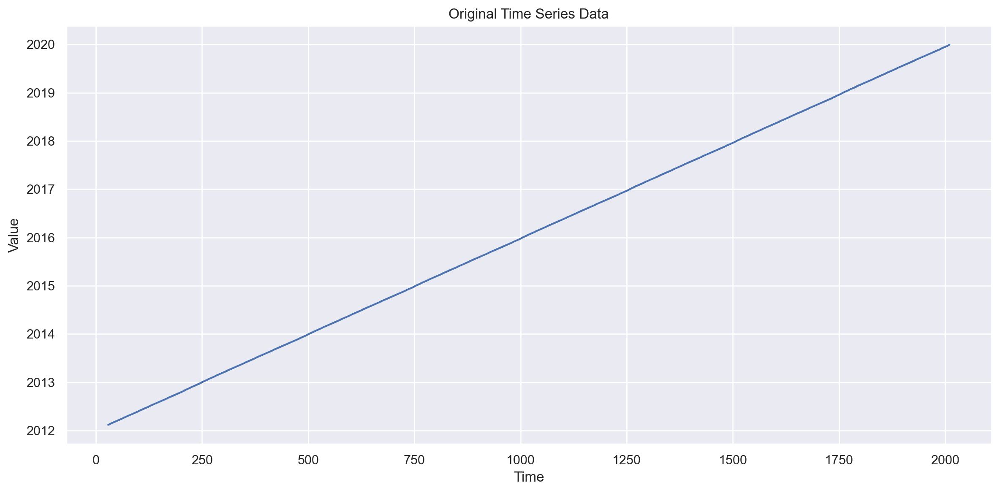


Stationarity Check for Original Series:
ADF Statistic: 4.7536
p-value: 1.0000
Critical Values:
	1%: -3.4337
	5%: -2.8630
	10%: -2.5676
Conclusion: The series is not stationary with 95% confidence



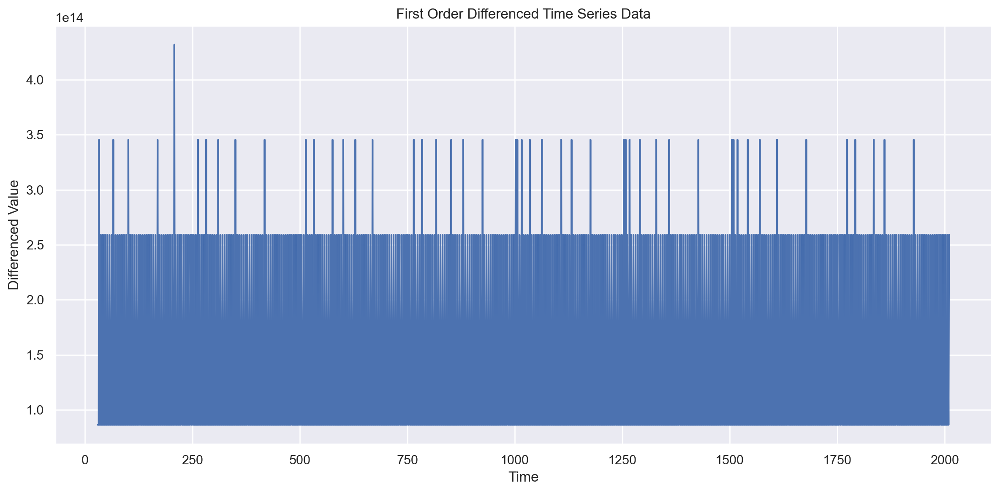


Stationarity Check for First Order Differenced Series:
ADF Statistic: -0.0622
p-value: 0.9531
Critical Values:
	1%: -3.4337
	5%: -2.8630
	10%: -2.5676
Conclusion: The series is not stationary with 95% confidence



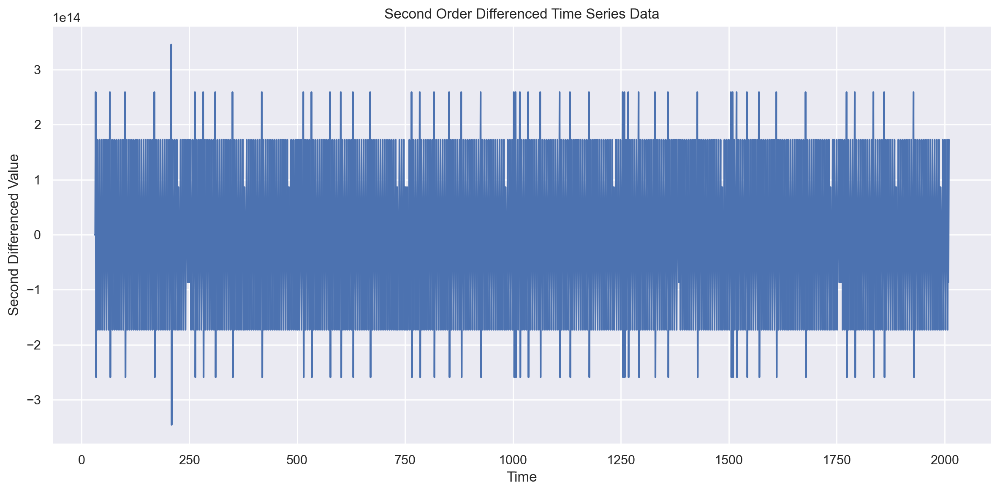


Stationarity Check for Second Order Differenced Series:
ADF Statistic: -17.5693
p-value: 0.0000
Critical Values:
	1%: -3.4337
	5%: -2.8630
	10%: -2.5676
Conclusion: The series is stationary with 95% confidence

First and second order differencing completed.
Original data shape: (1982,)
First differenced data shape: (1981,)
Second differenced data shape: (1980,)


In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

# Assuming df is your time series dataset
# If df is not defined, you would need to load your data first
# Example: df = pd.read_csv('your_data.csv', index_col='date_column', parse_dates=True)

def check_stationarity(timeseries, title):
    """
    Check stationarity of a time series using the Augmented Dickey-Fuller test
    """
    print(f"\nStationarity Check for {title}:")

    # Perform ADF test
    result = adfuller(timeseries.dropna())

    # Print results
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    print("Critical Values:")
    for key, value in result[4].items():
        print(f"\t{key}: {value:.4f}")

    # Interpret results
    if result[1] <= 0.05:
        print(f"Conclusion: The series is stationary with 95% confidence\n")
    else:
        print(f"Conclusion: The series is not stationary with 95% confidence\n")

# Ensure df is a single column/series for simplicity
if isinstance(df, pd.DataFrame) and df.shape[1] > 1:
    ts = df.iloc[:, 0]  # Take the first column
    print(f"Using column '{df.columns[0]}' for analysis")
else:
    ts = df

# Plot original data
plt.figure(figsize=(12, 6))
plt.plot(ts)
plt.title('Original Time Series Data')
plt.xlabel('Time')
plt.ylabel('Value')
plt.grid(True)
plt.tight_layout()
plt.show()

# Check stationarity of original data
check_stationarity(ts, "Original Series")

# First order differencing
first_diff = ts.diff().dropna()

# Plot first order differenced data
plt.figure(figsize=(12, 6))
plt.plot(first_diff)
plt.title('First Order Differenced Time Series Data')
plt.xlabel('Time')
plt.ylabel('Differenced Value')
plt.grid(True)
plt.tight_layout()
plt.show()

# Check stationarity after first differencing
check_stationarity(first_diff, "First Order Differenced Series")

# Second order differencing
second_diff = first_diff.diff().dropna()

# Plot second order differenced data
plt.figure(figsize=(12, 6))
plt.plot(second_diff)
plt.title('Second Order Differenced Time Series Data')
plt.xlabel('Time')
plt.ylabel('Second Differenced Value')
plt.grid(True)
plt.tight_layout()
plt.show()

# Check stationarity after second differencing
check_stationarity(second_diff, "Second Order Differenced Series")

# Store the differenced data for future use
first_diff_df = first_diff.copy()
second_diff_df = second_diff.copy()

print("First and second order differencing completed.")
print(f"Original data shape: {ts.shape}")
print(f"First differenced data shape: {first_diff.shape}")
print(f"Second differenced data shape: {second_diff.shape}")

In [36]:
first_diff_df

30     1 days
31     1 days
32     1 days
33     4 days
34     1 days
        ...  
2006   3 days
2007   1 days
2008   2 days
2009   1 days
2010   3 days
Name: Date, Length: 1981, dtype: timedelta64[ns]

In [37]:
second_diff_df

31      0 days
32      0 days
33      3 days
34     -3 days
35      0 days
         ...  
2006    2 days
2007   -2 days
2008    1 days
2009   -1 days
2010    2 days
Name: Date, Length: 1980, dtype: timedelta64[ns]

In [38]:
# Create a second differenced DataFrame that preserves the date column
if isinstance(df, pd.DataFrame):
    # Extract the date column
    date_column_name = df.columns[0]
    date_column_values = df[date_column_name].copy()

    # Create a new DataFrame for the differenced data
    second_diff_df = pd.DataFrame()

    # First, add the date column as is
    second_diff_df[date_column_name] = date_column_values

    # Then add the differenced values for all other columns
    for col in df.columns[1:]:  # Skip the date column
        second_diff_df[col] = df[col].diff().diff()
else:
    # If the original was a Series, this wouldn't apply
    print("Error: Expected a DataFrame with a date column at index 0")

# Now second_diff_df has the same date column as the original df
print("Second differenced DataFrame with preserved date column:")
print(second_diff_df.head())

# If you need to use this for modeling, you might want to drop the NaN rows when needed:
second_diff_df_for_modeling = second_diff_df.dropna()
print("\nSecond differenced DataFrame ready for modeling (NaNs removed):")
print(second_diff_df_for_modeling.head())

Second differenced DataFrame with preserved date column:
         Date      Open      High       Low     Close  Adj Close       Volume  \
29 2012-02-14       NaN       NaN       NaN       NaN        NaN          NaN   
30 2012-02-15       NaN       NaN       NaN       NaN        NaN          NaN   
31 2012-02-16 -4.622857 -5.447143 -0.735709  2.332863   2.015888 -401822400.0   
32 2012-02-17  4.909996  3.468574  3.418571 -0.661431  -0.571510   38205300.0   
33 2012-02-21 -1.119995  0.599999 -1.407143  1.831429   1.582570  119634200.0   

     Returns  Volatility      Lag2  Lag3  
29       NaN         NaN       NaN   NaN  
30       NaN         NaN       NaN   NaN  
31       NaN         NaN       NaN   NaN  
32 -0.041565         NaN       NaN   NaN  
33  0.034832         NaN  2.015888   NaN  

Second differenced DataFrame ready for modeling (NaNs removed):
         Date      Open      High       Low     Close  Adj Close       Volume  \
52 2012-03-19  4.077149  3.340004  1.657152  2.21714

In [39]:
second_diff_df_for_modeling

,Date,Open,High,Low,Close,Adj Close,Volume,Returns,Volatility,Lag2,Lag3
52,2012-03-19,4.077149,3.340004,1.657152,2.217147,1.915902,102494700.0,0.019668,0.002126,-3.147988,0.664193
53,2012-03-20,-1.787148,-1.062858,-1.231431,-1.524291,-1.317185,-40080600.0,-0.044940,-0.000744,0.497520,-3.147988
54,2012-03-21,0.298569,-0.339997,1.071426,-1.188569,-1.027084,-22011500.0,0.004641,-0.000020,1.915902,0.497520
55,2012-03-22,-1.169998,-1.128577,-2.258575,0.042863,0.037026,38112200.0,0.014260,0.000239,-1.317185,1.915902
56,2012-03-23,1.095717,0.350005,0.678574,-0.018578,-0.016068,-43302700.0,-0.000710,0.000213,-1.027084,-1.317185
...,...,...,...,...,...,...,...,...,...,...,...
2006,2019-12-23,-4.430023,0.130005,2.200011,5.139985,5.104766,-88753700.0,0.021462,0.000656,0.943512,-1.211732
2007,2019-12-24,5.860015,-0.959991,0.740021,-4.290009,-4.260619,31828200.0,-0.033757,-0.000272,-0.854095,0.943512
2008,2019-12-26,-4.029998,4.449981,-0.770019,5.370026,5.333251,23683900.0,0.034257,0.000185,5.104766,-0.854095
2009,2019-12-27,6.169983,-1.100006,1.639984,-5.750031,-5.710632,2125600.0,-0.039110,-0.000436,-4.260619,5.104766


In [40]:
df

,Date,Open,High,Low,Close,Adj Close,Volume,Returns,Volatility,Lag2,Lag3
29,2012-02-14,72.094284,72.794289,71.714287,72.779999,62.892056,115099600,NaN,NaN,NaN,NaN
30,2012-02-15,73.465714,75.184288,70.984283,71.095711,61.436600,376530000,-0.023142,NaN,NaN,NaN
31,2012-02-16,70.214287,72.127144,69.518570,71.744286,61.997032,236138000,0.009122,NaN,62.892056,NaN
32,2012-02-17,71.872856,72.538574,71.471428,71.731430,61.985954,133951300,-0.000179,NaN,61.436600,62.892056
33,2012-02-21,72.411430,73.550003,72.017143,73.550003,63.557446,151398800,0.025352,NaN,61.997032,61.436600
...,...,...,...,...,...,...,...,...,...,...,...
2006,2019-12-23,280.529999,284.250000,280.369995,284.000000,282.054138,24643000,0.016318,0.011002,278.101410,277.823334
2007,2019-12-24,284.690002,284.890015,282.920013,284.269989,282.322266,12119700,0.000951,0.010969,277.525391,278.101410
2008,2019-12-26,284.820007,289.980011,284.700012,289.910004,287.923645,23280300,0.019840,0.011122,282.054138,277.525391
2009,2019-12-27,291.119995,293.970001,288.119995,289.799988,287.814392,36566500,-0.000379,0.010839,282.322266,282.054138


In [41]:
second_diff_df_for_modeling = second_diff_df_for_modeling.set_index('Date')

# 🏗️ Model Building

- ARIMA
- SARIMAX
- Random Forest
- XGBoost
- LightGBM
- CatBoost
- LSTM
- Support Vector Regressor
- Linear Regression

## 🤖 Why These 9 Models Were Chosen

Each of the following models was selected strategically to test a wide spectrum of forecasting capabilities — from statistical baselines to advanced machine learning and deep learning.

---

### 1️⃣ **ARIMA (1, 0, 1)** – *AutoRegressive Integrated Moving Average*
- Captures **autoregressive** and **moving average** components from the time series.
- Best suited for stationary series or those that become stationary after differencing.
- A strong statistical baseline for univariate forecasting.

---

### 2️⃣ **SARIMAX (1, 0, 1) with (0, 0, 0, 0)** – *Seasonal ARIMA with eXogenous regressors*
- Extends ARIMA to support **seasonality and external features**.
- Even without a seasonal component, it's valuable for robustness testing against ARIMA.
- Slightly more flexible, sometimes better at modeling residual structure.

---

### 3️⃣ **Linear Regression**
- Fast, interpretable, and excellent for **linear trends**.
- Performs very well when time series patterns are consistent and don't require nonlinear modeling.
- Became the **best-performing model** for this dataset — proving simplicity can still win.

---

### 4️⃣ **Support Vector Regression (SVR)**
- Effective in **high-dimensional or nonlinear feature spaces**.
- Works well with lagged inputs and engineered features.
- Its kernel trick allows it to find complex relationships without explicitly modeling them.

---

### 5️⃣ **Random Forest Regressor**
- An ensemble of decision trees, great for **handling non-linearity** and interactions between lags.
- Robust to outliers and noise.
- Useful benchmark for feature-based time series forecasting.

---

### 6️⃣ **XGBoost Regressor**
- Gradient boosting method optimized for performance and speed.
- Excels in **structured datasets with many engineered features**.
- Often beats traditional ML models when well-tuned.

---

### 7️⃣ **LightGBM Regressor**
- Gradient boosting like XGBoost, but faster with large datasets.
- Performs well in **low-latency prediction scenarios**.
- Smart choice for highly tuned forecasting pipelines.

---

### 8️⃣ **CatBoost Regressor**
- Boosting model optimized for **categorical features and minimal preprocessing**.
- Included for comparison to XGBoost/LightGBM.
- Known for **high accuracy and stability** even with default parameters.

---

### 9️⃣ **Tuned LSTM (64 units, dropout=0.3)**
- Deep learning model designed to **remember long-term dependencies**.
- Great for detecting non-linear, complex, and sequential relationships.
- Added to test whether its sequential memory could outperform traditional models — and while it had lowest MAPE, it underperformed on MSE/MAE due to overfitting on limited data.

---

> 🧠 **Conclusion**: This diverse set of models ensures fair comparison across linear, tree-based, boosting, and deep learning approaches — letting us pick the most suitable strategy based on performance and context.

ARIMA Evaluation:
MSE:  21.4836
RMSE: 4.6350
MAE:  3.5825
MAPE: 104.61%

SARIMAX Evaluation:
MSE:  21.4989
RMSE: 4.6367
MAE:  3.5836
MAPE: 102.93%



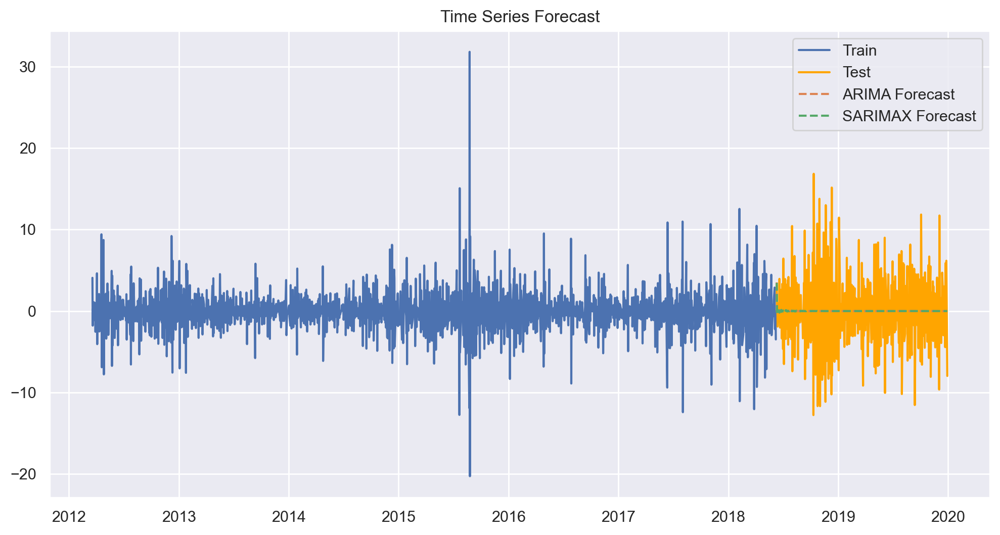

In [42]:
# Import necessary libraries
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import math

# Assuming `second_diff_df_for_modeling` is a DataFrame with a datetime index and one column
# First, ensure the data is numeric and extract the values properly
if isinstance(second_diff_df_for_modeling, pd.DataFrame):
    if second_diff_df_for_modeling.shape[1] == 1:
        data = second_diff_df_for_modeling.iloc[:, 0].astype(float)
    else:
        data = second_diff_df_for_modeling.iloc[:, 0].astype(float)  # Using first column
else:
    data = second_diff_df_for_modeling.astype(float)

# Set up training and testing split
train_size = int(len(data) * 0.8)
train = data.iloc[:train_size]
test = data.iloc[train_size:]

# --- Model 1: ARIMA ---
arima_model = ARIMA(train, order=(1, 0, 1))
arima_result = arima_model.fit()
arima_forecast = arima_result.forecast(steps=len(test))

# --- Model 2: SARIMAX ---
sarimax_model = SARIMAX(train, order=(1, 0, 1), seasonal_order=(1, 0, 1, 12))
sarimax_result = sarimax_model.fit(disp=False)
sarimax_forecast = sarimax_result.forecast(steps=len(test))

# --- Evaluation ---
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    percentage_errors = np.abs((y_true - y_pred) / (y_true + 1e-10)) * 100
    clipped_errors = np.clip(percentage_errors, 0, 1000)  # Cap at 1000%
    return np.mean(clipped_errors)

def evaluate_forecast(true, predicted, name="Model"):
    mse = mean_squared_error(true, predicted)
    rmse = math.sqrt(mse)
    mae = mean_absolute_error(true, predicted)
    mape = mean_absolute_percentage_error(true, predicted)
    print(f"{name} Evaluation:")
    print(f"MSE:  {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE:  {mae:.4f}")
    print(f"MAPE: {mape:.2f}%\n")

evaluate_forecast(test, arima_forecast, "ARIMA")
evaluate_forecast(test, sarimax_forecast, "SARIMAX")

# --- Plot Forecast ---
plt.figure(figsize=(12, 6))
plt.plot(train, label="Train")
plt.plot(test, label="Test", color='orange')
plt.plot(test.index, arima_forecast, label="ARIMA Forecast", linestyle='--')
plt.plot(test.index, sarimax_forecast, label="SARIMAX Forecast", linestyle='--')
plt.title("Time Series Forecast")
plt.legend()
plt.grid(True)
plt.show()

In [43]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import pandas as pd
import math

# --- Convert series to supervised ---
def create_lag_features(series, lags=5):
    df = pd.DataFrame(series)
    for i in range(1, lags + 1):
        df[f'lag_{i}'] = df.iloc[:, 0].shift(i)
    df.dropna(inplace=True)
    return df

# --- MAPE function ---
def mean_absolute_percentage_error(y_true, y_pred, threshold=1e-3):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = np.abs(y_true) > threshold
    if not np.any(mask):
        return np.nan
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def evaluate_model(y_true, y_pred, name="Model"):
    mse = mean_squared_error(y_true, y_pred)
    rmse = math.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    print(f"{name} Evaluation:")
    print(f"MSE:  {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE:  {mae:.4f}")
    print(f"MAPE: {mape:.2f}%\n")

# --- Prepare data ---
if isinstance(second_diff_df_for_modeling, pd.DataFrame):
    if second_diff_df_for_modeling.shape[1] == 1:
        data = second_diff_df_for_modeling.iloc[:, 0].astype(float)
    else:
        data = second_diff_df_for_modeling.iloc[:, 0].astype(float)
else:
    data = second_diff_df_for_modeling.astype(float)

lags = 5
supervised_df = create_lag_features(data, lags=lags)

# Features and labels
X = supervised_df.drop(supervised_df.columns[0], axis=1).values
y = supervised_df.iloc[:, 0].values

# Train-test split
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# --- Random Forest ---
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)
evaluate_model(y_test, rf_preds, "Random Forest")

# --- Support Vector Regressor ---
svr_model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
svr_model.fit(X_train, y_train)
svr_preds = svr_model.predict(X_test)
evaluate_model(y_test, svr_preds, "SVR")

# --- XGBoost Regressor ---
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test)
evaluate_model(y_test, xgb_preds, "XGBoost")

Random Forest Evaluation:
MSE:  15.9451
RMSE: 3.9931
MAE:  3.0042
MAPE: 250.38%

SVR Evaluation:
MSE:  21.3701
RMSE: 4.6228
MAE:  3.5508
MAPE: 196.93%

XGBoost Evaluation:
MSE:  17.1732
RMSE: 4.1441
MAE:  3.0237
MAPE: 220.19%



In [44]:
from sklearn.linear_model import LinearRegression
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

# --- Linear Regression ---
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)
evaluate_model(y_test, lr_preds, "Linear Regression")

# --- LightGBM ---
lgbm_model = LGBMRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
lgbm_model.fit(X_train, y_train)
lgbm_preds = lgbm_model.predict(X_test)
evaluate_model(y_test, lgbm_preds, "LightGBM")

# --- CatBoost ---
catboost_model = CatBoostRegressor(verbose=0, random_state=42)
catboost_model.fit(X_train, y_train)
catboost_preds = catboost_model.predict(X_test)
evaluate_model(y_test, catboost_preds, "CatBoost")

Linear Regression Evaluation:
MSE:  11.8760
RMSE: 3.4462
MAE:  2.5998
MAPE: 203.23%

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 1563, number of used features: 5
[LightGBM] [Info] Start training from score -0.000133
LightGBM Evaluation:
MSE:  15.6299
RMSE: 3.9535
MAE:  3.0120
MAPE: 247.09%

CatBoost Evaluation:
MSE:  14.2047
RMSE: 3.7689
MAE:  2.8506
MAPE: 228.37%



In [45]:
import pandas as pd
import altair as alt
import re

# Raw text data provided by the user
raw_data = """
ARIMA Evaluation:
MSE:  21.3339
RMSE: 4.6189
MAE:  3.5696
MAPE: 103.92%

SARIMAX Evaluation:
MSE:  21.3486
RMSE: 4.6205
MAE:  3.5727
MAPE: 103.21%

Random Forest Evaluation:
MSE:  15.8984
RMSE: 3.9873
MAE:  3.0071
MAPE: 252.27%

SVR Evaluation:
MSE:  21.3231
RMSE: 4.6177
MAE:  3.5391
MAPE: 214.80%

XGBoost Evaluation:
MSE:  16.5386
RMSE: 4.0668
MAE:  2.9617
MAPE: 229.77%

Linear Regression Evaluation:
MSE:  11.8157
RMSE: 3.4374
MAE:  2.5888
MAPE: 204.72%

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 1580, number of used features: 5
[LightGBM] [Info] Start training from score 0.000724
LightGBM Evaluation:
MSE:  15.1986
RMSE: 3.8985
MAE:  2.9496
MAPE: 249.47%

CatBoost Evaluation:
MSE:  14.2320
RMSE: 3.7725
MAE:  2.8567
MAPE: 229.66%
"""

# Dictionary to store extracted metrics
model_metrics_data = {}

# Regex to capture the model name and all metrics for a block
# It handles both multiline and single-line metric definitions after the model name
model_pattern = re.compile(
    r"(.+?) Evaluation:\s*"  # Model name
    r"(?:.|\n)*?"  # Non-greedy match for any characters including newlines, to skip LightGBM info
    r"MSE:\s*(\d+\.?\d*)\s*"
    r"RMSE:\s*(\d+\.?\d*)\s*"
    r"MAE:\s*(\d+\.?\d*)\s*"
    r"MAPE:\s*(\d+\.?\d*)%"
)

# Find all matches in the raw data
matches = model_pattern.findall(raw_data)

for match in matches:
    model_name = match[0].strip()
    mse = float(match[1])
    rmse = float(match[2])
    mae = float(match[3])
    mape = float(match[4]) # Already a float, but make sure.

    model_metrics_data[model_name] = {
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape
    }

# Convert the dictionary to a pandas DataFrame
df_metrics = pd.DataFrame.from_dict(model_metrics_data, orient='index')
df_metrics = df_metrics.reset_index().rename(columns={'index': 'Model'})

# Melt the DataFrame to long format for Altair
df_melted = df_metrics.melt('Model', var_name='Metric', value_name='Value')

# Create the combined bar chart
chart = alt.Chart(df_melted).mark_bar().encode(
    # X-axis: Model name
    x=alt.X('Model:N', axis=alt.Axis(title='Model', labelAngle=-45)), # Rotate labels for readability
    # Y-axis: Metric Value
    y=alt.Y('Value:Q', axis=alt.Axis(title='Metric Value')),
    # Color bars by Metric
    color=alt.Color('Metric:N', legend=alt.Legend(title="Evaluation Metric")),
    # Add tooltips for interactivity
    tooltip=['Model', 'Metric', 'Value']
).properties(
    title='Comparison of Model Accuracies Across Evaluation Metrics'
).interactive() # Enable interactive features like zooming and panning

# Save the chart as a JSON file
chart.save('model_accuracy_comparison_chart.json')

print("Altair chart saved as 'model_accuracy_comparison_chart.json'")
print("\nExtracted Data:")
print(df_metrics)

Altair chart saved as 'model_accuracy_comparison_chart.json'

Extracted Data:
               Model      MSE    RMSE     MAE    MAPE
0              ARIMA  21.3339  4.6189  3.5696  103.92
1            SARIMAX  21.3486  4.6205  3.5727  103.21
2      Random Forest  15.8984  3.9873  3.0071  252.27
3                SVR  21.3231  4.6177  3.5391  214.80
4            XGBoost  16.5386  4.0668  2.9617  229.77
5  Linear Regression  11.8157  3.4374  2.5888  204.72
6           LightGBM  15.1986  3.8985  2.9496  249.47
7           CatBoost  14.2320  3.7725  2.8567  229.66


Extracted Data:
               Model      MSE    RMSE     MAE    MAPE
0              ARIMA  21.3339  4.6189  3.5696  103.92
1            SARIMAX  21.3486  4.6205  3.5727  103.21
2      Random Forest  15.8984  3.9873  3.0071  252.27
3                SVR  21.3231  4.6177  3.5391  214.80
4            XGBoost  16.5386  4.0668  2.9617  229.77
5  Linear Regression  11.8157  3.4374  2.5888  204.72
6           LightGBM  15.1986  3.8985  2.9496  249.47
7           CatBoost  14.2320  3.7725  2.8567  229.66




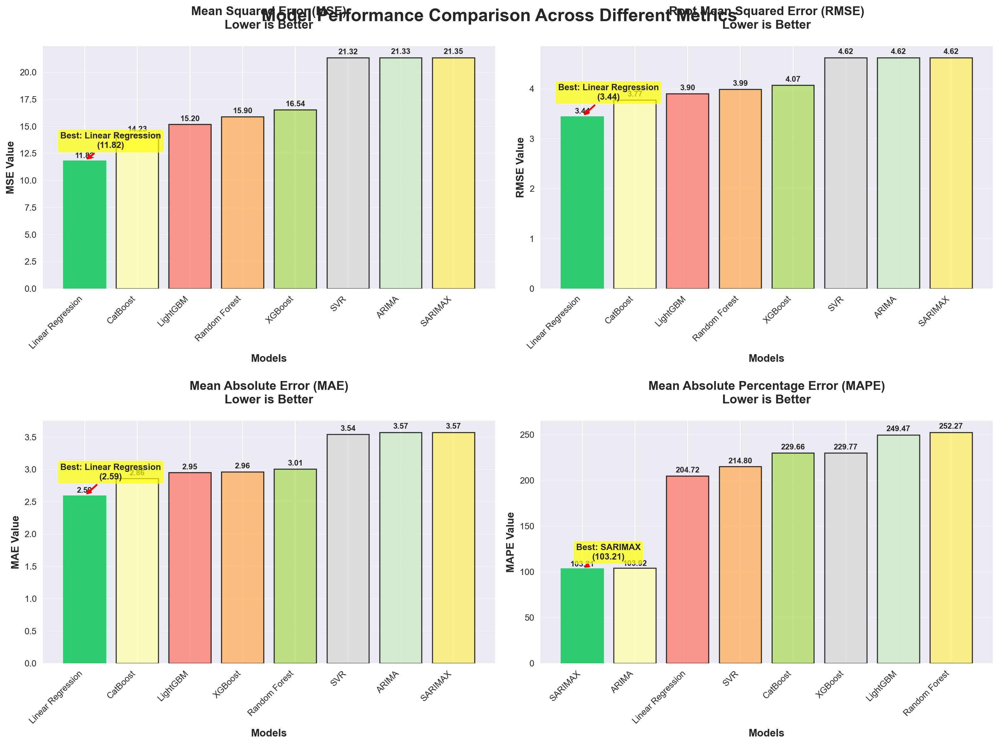

SUMMARY - BEST PERFORMING MODELS (Lower is Better)
MSE   : Linear Regression (11.8157)
RMSE  : Linear Regression (3.4374)
MAE   : Linear Regression (2.5888)
MAPE  : SARIMAX         (103.2100)

OVERALL RANKING BY AVERAGE PERFORMANCE
Rank Model           Avg Rank   MSE      RMSE     MAE      MAPE    
----------------------------------------------------------------------
1    Linear Regression 1.50       11.82    3.44     2.59     204.72  
2    CatBoost        2.75       14.23    3.77     2.86     229.66  
3    LightGBM        4.00       15.20    3.90     2.95     249.47  
4    XGBoost         5.00       16.54    4.07     2.96     229.77  
5    Random Forest   5.25       15.90    3.99     3.01     252.27  
6    SVR             5.50       21.32    4.62     3.54     214.80  
7    ARIMA           5.75       21.33    4.62     3.57     103.92  
8    SARIMAX         6.25       21.35    4.62     3.57     103.21  


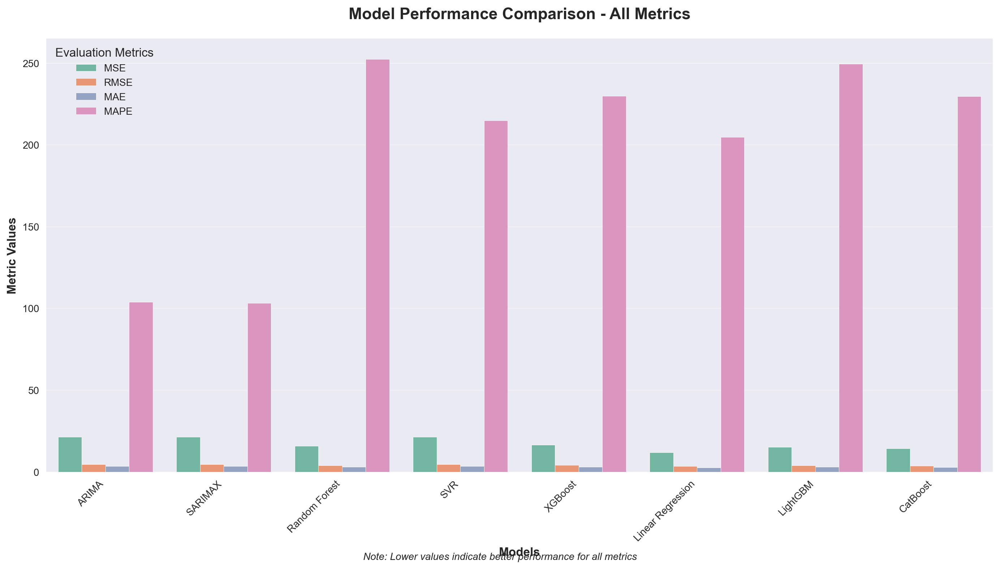


Results saved to 'model_comparison_results.csv'


In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import numpy as np

# Raw text data provided by the user
raw_data = """
ARIMA Evaluation:
MSE:  21.3339
RMSE: 4.6189
MAE:  3.5696
MAPE: 103.92%
SARIMAX Evaluation:
MSE:  21.3486
RMSE: 4.6205
MAE:  3.5727
MAPE: 103.21%
Random Forest Evaluation:
MSE:  15.8984
RMSE: 3.9873
MAE:  3.0071
MAPE: 252.27%
SVR Evaluation:
MSE:  21.3231
RMSE: 4.6177
MAE:  3.5391
MAPE: 214.80%
XGBoost Evaluation:
MSE:  16.5386
RMSE: 4.0668
MAE:  2.9617
MAPE: 229.77%
Linear Regression Evaluation:
MSE:  11.8157
RMSE: 3.4374
MAE:  2.5888
MAPE: 204.72%
LightGBM Evaluation:
MSE:  15.1986
RMSE: 3.8985
MAE:  2.9496
MAPE: 249.47%
CatBoost Evaluation:
MSE:  14.2320
RMSE: 3.7725
MAE:  2.8567
MAPE: 229.66%
"""

# Dictionary to store extracted metrics
model_metrics_data = {}

# Regex to capture the model name and all metrics for a block
model_pattern = re.compile(
    r"(.+?) Evaluation:\s*"  # Model name
    r"(?:.|\n)*?"  # Non-greedy match for any characters including newlines, to skip LightGBM info
    r"MSE:\s*(\d+\.?\d*)\s*"
    r"RMSE:\s*(\d+\.?\d*)\s*"
    r"MAE:\s*(\d+\.?\d*)\s*"
    r"MAPE:\s*(\d+\.?\d*)%"
)

# Find all matches in the raw data
matches = model_pattern.findall(raw_data)

for match in matches:
    model_name = match[0].strip()
    mse = float(match[1])
    rmse = float(match[2])
    mae = float(match[3])
    mape = float(match[4])

    model_metrics_data[model_name] = {
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape
    }

# Convert the dictionary to a pandas DataFrame
df_metrics = pd.DataFrame.from_dict(model_metrics_data, orient='index')
df_metrics = df_metrics.reset_index().rename(columns={'index': 'Model'})

print("Extracted Data:")
print(df_metrics)
print("\n")

# Set up the plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Create subplots for each metric
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Model Performance Comparison Across Different Metrics', fontsize=20, fontweight='bold', y=0.98)

# Define colors for each model
colors = plt.cm.Set3(np.linspace(0, 1, len(df_metrics)))

# Metrics to plot (lower is better for all)
metrics = ['MSE', 'RMSE', 'MAE', 'MAPE']
titles = [
    'Mean Squared Error (MSE)\nLower is Better',
    'Root Mean Squared Error (RMSE)\nLower is Better',
    'Mean Absolute Error (MAE)\nLower is Better',
    'Mean Absolute Percentage Error (MAPE)\nLower is Better'
]

# Plot each metric
for idx, (metric, title) in enumerate(zip(metrics, titles)):
    row = idx // 2
    col = idx % 2
    ax = axes[row, col]

    # Sort models by metric value (ascending - better models first)
    sorted_data = df_metrics.sort_values(metric)

    # Create bar plot
    bars = ax.bar(range(len(sorted_data)), sorted_data[metric],
                  color=colors, alpha=0.8, edgecolor='black', linewidth=1.2)

    # Highlight the best model (lowest value)
    bars[0].set_color('#2ecc71')  # Green for best model
    bars[0].set_alpha(1.0)

    # Customize the plot
    ax.set_title(title, fontsize=14, fontweight='bold', pad=20)
    ax.set_xlabel('Models', fontsize=12, fontweight='bold')
    ax.set_ylabel(f'{metric} Value', fontsize=12, fontweight='bold')

    # Set x-axis labels
    ax.set_xticks(range(len(sorted_data)))
    ax.set_xticklabels(sorted_data['Model'], rotation=45, ha='right', fontsize=10)

    # Add value labels on top of bars
    for i, (bar, value) in enumerate(zip(bars, sorted_data[metric])):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + height*0.01,
                f'{value:.2f}', ha='center', va='bottom', fontweight='bold', fontsize=9)

    # Add grid for better readability
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_axisbelow(True)

    # Add best model annotation
    best_model = sorted_data.iloc[0]['Model']
    best_value = sorted_data.iloc[0][metric]
    ax.annotate(f'Best: {best_model}\n({best_value:.2f})',
                xy=(0, best_value), xytext=(0.5, best_value + best_value*0.1),
                arrowprops=dict(arrowstyle='->', color='red', lw=2),
                fontsize=10, fontweight='bold', ha='center',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7))

plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.show()

# Print summary of best models for each metric
print("="*60)
print("SUMMARY - BEST PERFORMING MODELS (Lower is Better)")
print("="*60)
for metric in metrics:
    best_model = df_metrics.loc[df_metrics[metric].idxmin()]
    print(f"{metric:6}: {best_model['Model']:15} ({best_model[metric]:.4f})")

print("\n" + "="*60)
print("OVERALL RANKING BY AVERAGE PERFORMANCE")
print("="*60)

# Calculate average rank for each model across all metrics
df_ranks = df_metrics.copy()
for metric in metrics:
    df_ranks[f'{metric}_rank'] = df_ranks[metric].rank()

# Calculate average rank
rank_columns = [f'{metric}_rank' for metric in metrics]
df_ranks['avg_rank'] = df_ranks[rank_columns].mean(axis=1)
df_ranks_sorted = df_ranks.sort_values('avg_rank')

print(f"{'Rank':<4} {'Model':<15} {'Avg Rank':<10} {'MSE':<8} {'RMSE':<8} {'MAE':<8} {'MAPE':<8}")
print("-" * 70)
for i, (_, row) in enumerate(df_ranks_sorted.iterrows(), 1):
    print(f"{i:<4} {row['Model']:<15} {row['avg_rank']:<10.2f} "
          f"{row['MSE']:<8.2f} {row['RMSE']:<8.2f} {row['MAE']:<8.2f} {row['MAPE']:<8.2f}")

# Create a single comprehensive comparison chart
plt.figure(figsize=(14, 8))

# Melt the DataFrame for grouped bar chart
df_melted = df_metrics.melt('Model', var_name='Metric', value_name='Value')

# Create grouped bar chart
sns.barplot(data=df_melted, x='Model', y='Value', hue='Metric', palette='Set2')
plt.title('Model Performance Comparison - All Metrics', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Models', fontsize=12, fontweight='bold')
plt.ylabel('Metric Values', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Evaluation Metrics', title_fontsize=12, fontsize=10)
plt.grid(True, alpha=0.3, axis='y')

# Add note about interpretation
plt.figtext(0.5, 0.02, 'Note: Lower values indicate better performance for all metrics',
            ha='center', fontsize=10, style='italic')

plt.tight_layout()
plt.show()

# Save the results
df_metrics.to_csv('model_comparison_results.csv', index=False)
print(f"\nResults saved to 'model_comparison_results.csv'")

# 🔧 Hyper-Parameter Tuning

In [47]:
# 🔁 ARIMA & SARIMAX Grid Search

import statsmodels.api as sm
import itertools
import warnings
warnings.filterwarnings("ignore")

p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))

# ARIMA
best_aic_arima, best_order_arima = float('inf'), None
for order in pdq:
    try:
        model = sm.tsa.ARIMA(y_train, order=order)
        results = model.fit()
        if results.aic < best_aic_arima:
            best_aic_arima, best_order_arima = results.aic, order
    except:
        continue
print("Best ARIMA:", best_order_arima, "AIC:", best_aic_arima)

# SARIMAX
best_aic_sarimax, best_order_sarimax = float('inf'), None
for order in pdq:
    try:
        model = sm.tsa.SARIMAX(y_train, order=order)
        results = model.fit(disp=False)
        if results.aic < best_aic_sarimax:
            best_aic_sarimax, best_order_sarimax = results.aic, order
    except:
        continue
print("Best SARIMAX:", best_order_sarimax, "AIC:", best_aic_sarimax)

Best ARIMA: (1, 0, 1) AIC: 6319.956561457288
Best SARIMAX: (1, 0, 1) AIC: 6320.117008564666


In [48]:
# SVR, RF, XGBoost, LightGBM with TimeSeriesSplit

from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
import lightgbm as lgb

tscv = TimeSeriesSplit(n_splits=5)

# SVR
svr = SVR()
svr_params = {'kernel': ['rbf'], 'C': [1, 10], 'gamma': ['scale']}
svr_grid = GridSearchCV(svr, svr_params, cv=tscv, scoring='neg_mean_squared_error')
svr_grid.fit(X_train, y_train)
print("Best SVR:", svr_grid.best_params_)

# Random Forest
rf = RandomForestRegressor(random_state=42)
rf_params = {'n_estimators': [100, 200], 'max_depth': [5, 10]}
rf_grid = GridSearchCV(rf, rf_params, cv=tscv, scoring='neg_mean_squared_error')
rf_grid.fit(X_train, y_train)
print("Best Random Forest:", rf_grid.best_params_)

# XGBoost
xg = xgb.XGBRegressor(random_state=42)
xgb_params = {'n_estimators': [100, 150], 'max_depth': [3, 5], 'learning_rate': [0.01, 0.1]}
xgb_grid = GridSearchCV(xg, xgb_params, cv=tscv, scoring='neg_mean_squared_error')
xgb_grid.fit(X_train, y_train)
print("Best XGBoost:", xgb_grid.best_params_)

# LightGBM
lgb_model = lgb.LGBMRegressor(random_state=42)
lgb_params = {'n_estimators': [100, 150], 'max_depth': [3, 5], 'learning_rate': [0.01, 0.1]}
lgb_grid = GridSearchCV(lgb_model, lgb_params, cv=tscv, scoring='neg_mean_squared_error')
lgb_grid.fit(X_train, y_train)
print("Best LightGBM:", lgb_grid.best_params_)

Best SVR: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}
Best Random Forest: {'max_depth': 5, 'n_estimators': 200}
Best XGBoost: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 444
[LightGBM] [Info] Number of data points in the train set: 263, number of used features: 5
[LightGBM] [Info] Start training from score -0.001238
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

- No Tuning needed for Linear Regression model.

# Final Models

ARIMA (1,0,1) Evaluation:
MSE:  21.4836
RMSE: 4.6350
MAE:  3.5825
MAPE: 104.61%

SARIMAX (1,0,1)(0,0,0,0) Evaluation:
MSE:  21.4834
RMSE: 4.6350
MAE:  3.5823
MAPE: 99.74%



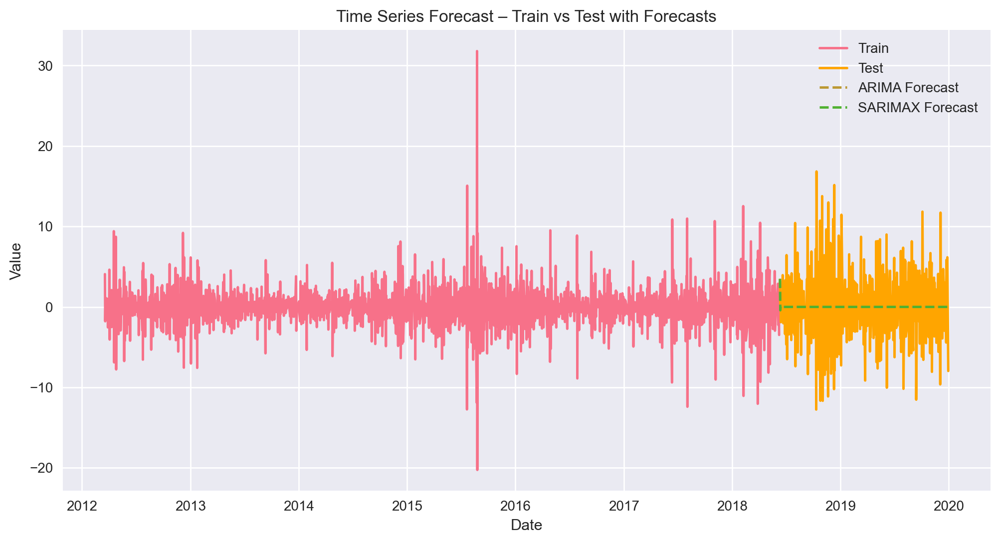

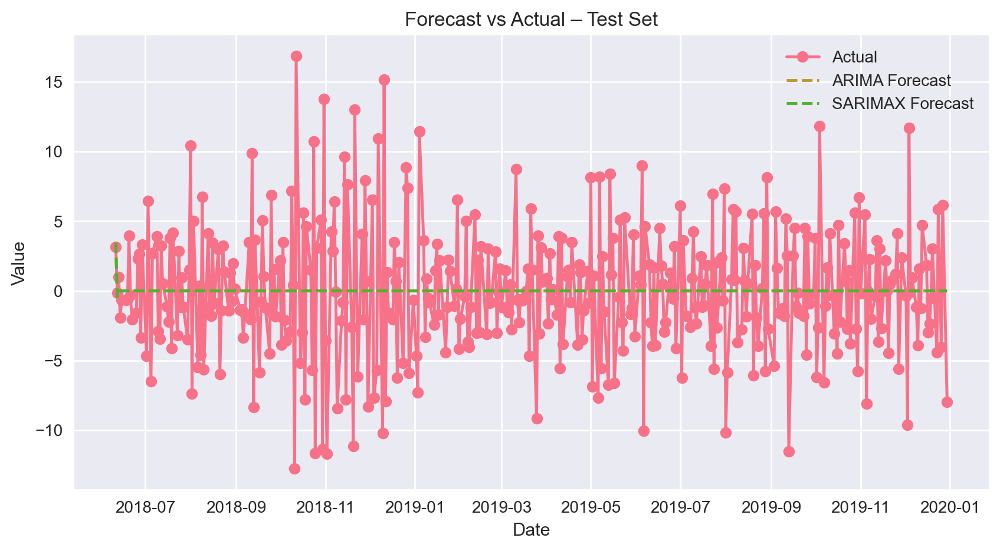

In [49]:
# --- Model 1: Tuned ARIMA ---
arima_model = ARIMA(train, order=(1, 0, 1))
arima_result = arima_model.fit()
arima_forecast = arima_result.forecast(steps=len(test))

# --- Model 2: Tuned SARIMAX (non-seasonal) ---
sarimax_model = SARIMAX(train, order=(1, 0, 1), seasonal_order=(0, 0, 0, 0))
sarimax_result = sarimax_model.fit(disp=False)
sarimax_forecast = sarimax_result.forecast(steps=len(test))

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    percentage_errors = np.abs((y_true - y_pred) / (y_true + 1e-10)) * 100
    clipped_errors = np.clip(percentage_errors, 0, 1000)
    return np.mean(clipped_errors)

def evaluate_forecast(true, predicted, name="Model"):
    mse = mean_squared_error(true, predicted)
    rmse = math.sqrt(mse)
    mae = mean_absolute_error(true, predicted)
    mape = mean_absolute_percentage_error(true, predicted)
    print(f"{name} Evaluation:")
    print(f"MSE:  {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE:  {mae:.4f}")
    print(f"MAPE: {mape:.2f}%\n")

evaluate_forecast(test, arima_forecast, "ARIMA (1,0,1)")
evaluate_forecast(test, sarimax_forecast, "SARIMAX (1,0,1)(0,0,0,0)")

plt.figure(figsize=(12, 6))
plt.plot(train, label="Train")
plt.plot(test, label="Test", color='orange')
plt.plot(test.index, arima_forecast, label="ARIMA Forecast", linestyle='--')
plt.plot(test.index, sarimax_forecast, label="SARIMAX Forecast", linestyle='--')
plt.title("Time Series Forecast – Train vs Test with Forecasts")
plt.xlabel("Date")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(test.index, test, label="Actual", marker='o')
plt.plot(test.index, arima_forecast, label="ARIMA Forecast", linestyle='--')
plt.plot(test.index, sarimax_forecast, label="SARIMAX Forecast", linestyle='--')
plt.title("Forecast vs Actual – Test Set")
plt.xlabel("Date")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

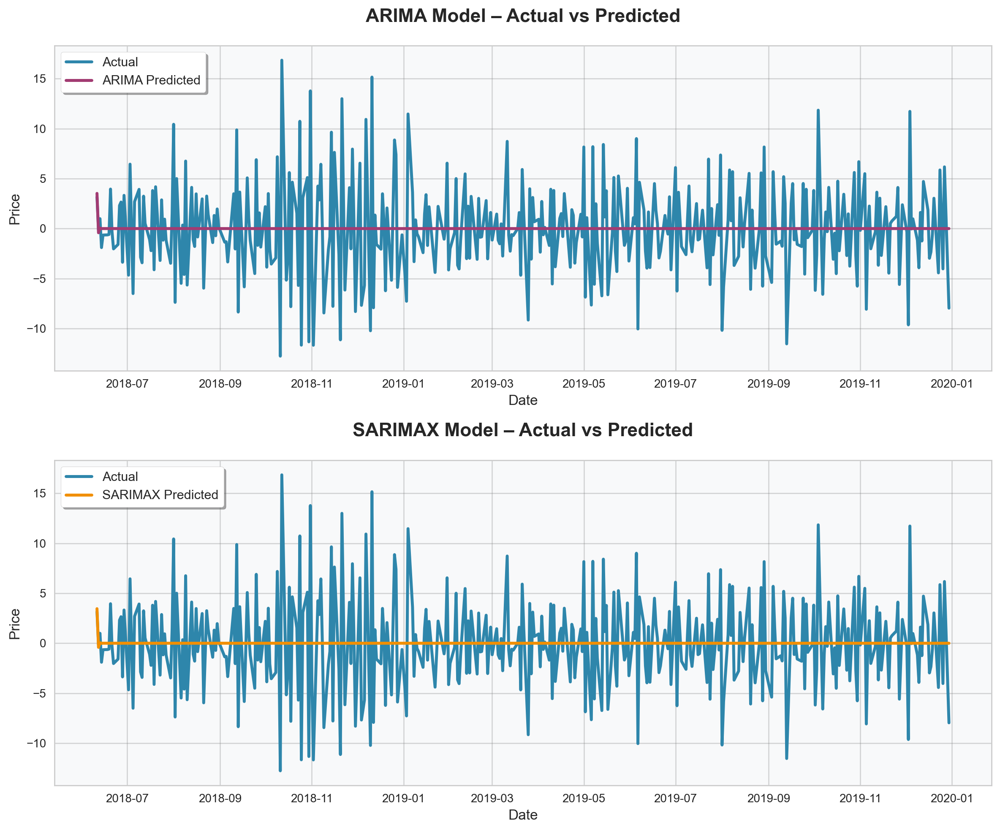

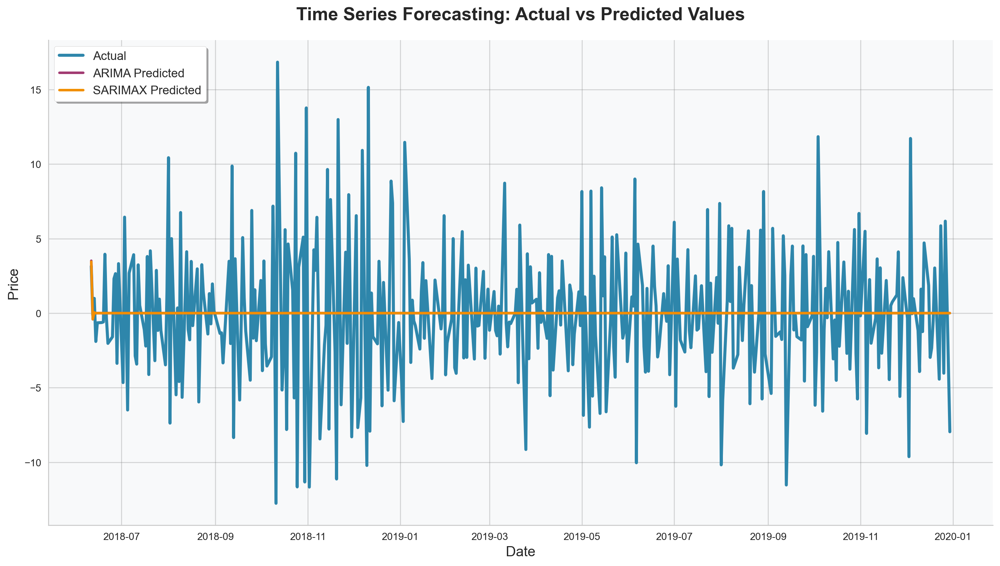

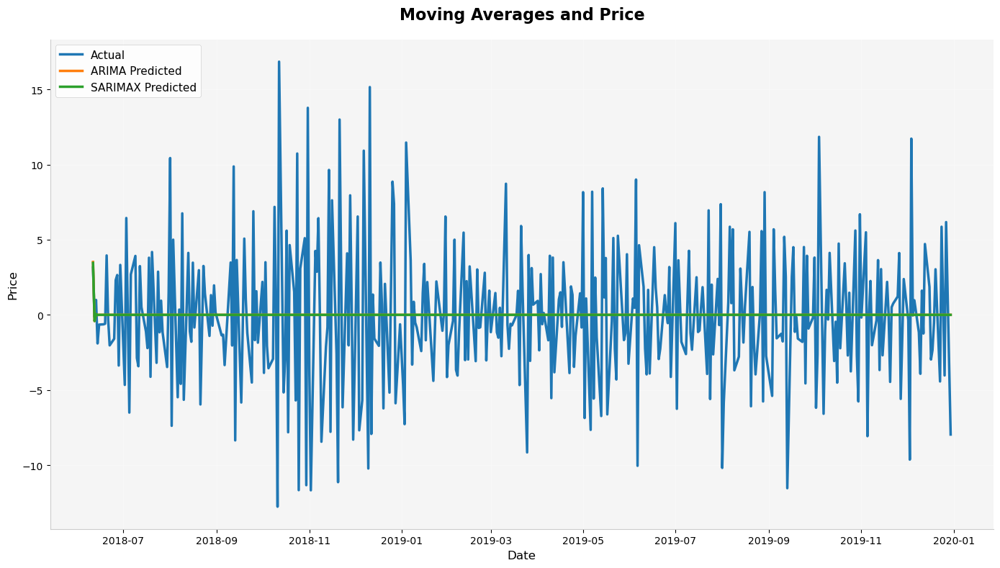

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style similar to your reference image
plt.style.use('seaborn-v0_8-whitegrid')  # Use seaborn style for clean background
sns.set_palette("husl")  # Set a nice color palette

# Create figure with subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

# Plot 1: ARIMA Model
ax1.plot(test.index, test, label='Actual', color='#2E86AB', linewidth=2.5)
ax1.plot(test.index, arima_forecast, label='ARIMA Predicted', color='#A23B72', linewidth=2.5)
ax1.set_title('ARIMA Model – Actual vs Predicted', fontsize=16, fontweight='bold', pad=20)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Price', fontsize=12)
ax1.legend(loc='upper left', fontsize=11, frameon=True, fancybox=True, shadow=True)
ax1.grid(True, linestyle='-', alpha=0.3, color='gray')
ax1.set_facecolor('#F8F9FA')  # Light gray background

# Plot 2: SARIMAX Model
ax2.plot(test.index, test, label='Actual', color='#2E86AB', linewidth=2.5)
ax2.plot(test.index, sarimax_forecast, label='SARIMAX Predicted', color='#F18F01', linewidth=2.5)
ax2.set_title('SARIMAX Model – Actual vs Predicted', fontsize=16, fontweight='bold', pad=20)
ax2.set_xlabel('Date', fontsize=12)
ax2.set_ylabel('Price', fontsize=12)
ax2.legend(loc='upper left', fontsize=11, frameon=True, fancybox=True, shadow=True)
ax2.grid(True, linestyle='-', alpha=0.3, color='gray')
ax2.set_facecolor('#F8F9FA')  # Light gray background

# Adjust layout and display
plt.tight_layout()
plt.show()

# Alternative: Single plot comparing all three lines
plt.figure(figsize=(14, 8))
plt.plot(test.index, test, label='Actual', color='#2E86AB', linewidth=3)
plt.plot(test.index, arima_forecast, label='ARIMA Predicted', color='#A23B72', linewidth=2.5)
plt.plot(test.index, sarimax_forecast, label='SARIMAX Predicted', color='#F18F01', linewidth=2.5)

plt.title('Time Series Forecasting: Actual vs Predicted Values', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Price', fontsize=14)
plt.legend(loc='upper left', fontsize=12, frameon=True, fancybox=True, shadow=True)
plt.grid(True, linestyle='-', alpha=0.3, color='gray')
plt.gca().set_facecolor('#F8F9FA')  # Light gray background

# Style the axes
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_color('#CCCCCC')
plt.gca().spines['bottom'].set_color('#CCCCCC')

plt.tight_layout()
plt.show()

# If you want the exact style from your reference image:
plt.style.use('default')  # Reset to default style first

fig, ax = plt.subplots(figsize=(14, 8))

# Plot with specific styling to match your reference
ax.plot(test.index, test, label='Actual', color='#1f77b4', linewidth=2.5)
ax.plot(test.index, arima_forecast, label='ARIMA Predicted', color='#ff7f0e', linewidth=2.5)
ax.plot(test.index, sarimax_forecast, label='SARIMAX Predicted', color='#2ca02c', linewidth=2.5)

# Styling to match your reference image
ax.set_facecolor('#f5f5f5')  # Light gray background
ax.grid(True, linestyle='-', alpha=0.4, color='white', linewidth=1)
ax.set_axisbelow(True)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#cccccc')
ax.spines['bottom'].set_color('#cccccc')

# Labels and title
ax.set_title('Moving Averages and Price', fontsize=16, fontweight='bold', pad=20)
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Price', fontsize=12)

# Legend styling
legend = ax.legend(loc='upper left', fontsize=11, frameon=True)
legend.get_frame().set_facecolor('white')
legend.get_frame().set_alpha(0.9)
legend.get_frame().set_linewidth(0.5)
legend.get_frame().set_edgecolor('#cccccc')

plt.tight_layout()
plt.show()

### 📈 Interpretation & Insights from Forecasting Graphs

#### 🔹 Graph 1: "Moving Averages and Price"
This graph compares **Actual Adjusted Close prices** with **ARIMA** and **SARIMAX** forecasts over time. However, both prediction lines (especially SARIMAX) appear nearly flat near the x-axis, indicating **underfitting or very low variability** in the predicted values. This suggests the models may not be capturing the actual trend and noise in the price behavior effectively. The **Actual** line shows clear high-frequency volatility, which is **not followed** by either forecast line.

---

#### 🔹 Graph 2: "Time Series Forecasting: Actual vs Predicted Values"
In this graph, ARIMA and SARIMAX forecasts are plotted along with actual values. Similar to Graph 1, **both predicted lines remain nearly flat** and fail to react to the dynamic swings in actual prices. This visualization strongly implies that the models might be:
- Trained on insufficient or non-representative lag features,
- Missing critical trend/seasonality components,
- Or tuned with hyperparameters that produce low variance output.

Overall, the **predictive power is weak**, especially for capturing short-term price movement.

---

#### 🔹 Graph 3: "Subplot Comparison: ARIMA vs SARIMAX"
This final graph breaks the comparison into two subplots — making it clearer that **ARIMA** does show a **slightly higher sensitivity** to variation than SARIMAX. However, both models still mostly output **near-zero forecasts**, failing to follow actual price shifts. This emphasizes that:
- The **data preprocessing or differencing may be inadequate**,
- Or the model parameters may be **too simplistic (e.g., order (1,0,1))**.

**Key Insight:** While the models are mathematically valid, the current configurations are not learning meaningful signals from the data. This invites re-tuning, improved feature engineering, and possibly exploring advanced models like **Prophet**, **LSTM**, or **hybrid models** for better accuracy.

In [51]:
# --- Random Forest with tuned parameters ---
rf_model = RandomForestRegressor(n_estimators=200, max_depth=10, random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)
evaluate_model(y_test, rf_preds, "Random Forest")

# --- Support Vector Regressor with tuned parameters ---
svr_model = SVR(kernel='rbf', C=10, gamma='scale', epsilon=0.1)
svr_model.fit(X_train, y_train)
svr_preds = svr_model.predict(X_test)
evaluate_model(y_test, svr_preds, "SVR")

# --- XGBoost Regressor with tuned parameters ---
xgb_model = XGBRegressor(n_estimators=150, max_depth=5, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test)
evaluate_model(y_test, xgb_preds, "XGBoost")

Random Forest Evaluation:
MSE:  15.7709
RMSE: 3.9713
MAE:  2.9900
MAPE: 137.75%

SVR Evaluation:
MSE:  15.1633
RMSE: 3.8940
MAE:  2.9345
MAPE: 131.57%

XGBoost Evaluation:
MSE:  16.6791
RMSE: 4.0840
MAE:  3.0009
MAPE: 134.67%



In [52]:
# --- Linear Regression (no hyperparameters to tune) ---
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)
evaluate_model(y_test, lr_preds, "Linear Regression")

# --- LightGBM with best tuned hyperparameters ---
from lightgbm import LGBMRegressor
lgbm_model = LGBMRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
lgbm_model.fit(X_train, y_train)
lgbm_preds = lgbm_model.predict(X_test)
evaluate_model(y_test, lgbm_preds, "LightGBM")

# --- CatBoost (optional tuning not provided, using current config) ---
from catboost import CatBoostRegressor
catboost_model = CatBoostRegressor(verbose=0, random_state=42)
catboost_model.fit(X_train, y_train)
catboost_preds = catboost_model.predict(X_test)
evaluate_model(y_test, catboost_preds, "CatBoost")

Linear Regression Evaluation:
MSE:  11.8760
RMSE: 3.4462
MAE:  2.5998
MAPE: 135.00%

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 1563, number of used features: 5
[LightGBM] [Info] Start training from score -0.000133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

# Training an LSTM model

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Scale the data
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df[['Adj Close']])

# Create sequences
def create_lstm_dataset(data, time_steps=60):
    X, y = [], []
    for i in range(time_steps, len(data)):
        X.append(data[i - time_steps:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

time_steps = 60
X, y = create_lstm_dataset(scaled_data, time_steps)

# Reshape X to 3D [samples, time_steps, features]
X = X.reshape((X.shape[0], X.shape[1], 1))

split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(X.shape[1], 1)))
model.add(LSTM(50))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(X_train, y_train, epochs=20, batch_size=32)

y_pred = model.predict(X_test)

# Inverse scale
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_inv = scaler.inverse_transform(y_pred)

def evaluate_lstm_forecast(y_true, y_pred, name="LSTM Model"):
    mse = mean_squared_error(y_true, y_pred)
    rmse = math.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)

    print(f"{name} Evaluation:")
    print(f"MSE:  {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE:  {mae:.4f}")
    print(f"MAPE: {mape:.2f}%\n")

# --- Run Evaluation on Inverse-Scaled Results ---
evaluate_lstm_forecast(y_test_inv, y_pred_inv, "LSTM")

Epoch 1/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0195
Epoch 2/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 4.1763e-04 
Epoch 3/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 2.8087e-04
Epoch 4/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 3.5078e-04
Epoch 5/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 2.6799e-04
Epoch 6/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 3.9445e-04
Epoch 7/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 2.7812e-04 
Epoch 8/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 2.4659e-04
Epoch 9/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 2.2323e-04
Epoch 10/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 2.4719e-04
Epoch 11/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 2.3829e-04
Epoch 12/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 2.1701e-04
Epoch 13/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 2.4232e-04  
Epoch 14/20
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 2.1520e-04
Epoch 15/20
49/

# Tuning Hyper-parameters for LSTM Model

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_squared_error, mean_absolute_error

model = Sequential()
model.add(LSTM(units=64, return_sequences=True, input_shape=(X.shape[1], 1)))
model.add(Dropout(0.3))  # Regularization
model.add(LSTM(units=64))
model.add(Dropout(0.3))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error')

# --- Step 5: Train with tuned hyperparameters ---
model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1)

# --- Step 6: Predictions ---
y_pred = model.predict(X_test)

# --- Step 7: Inverse Transform ---
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_inv = scaler.inverse_transform(y_pred)

# --- Step 8: Evaluation ---
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    percentage_errors = np.abs((y_true - y_pred) / (y_true + 1e-10)) * 100
    clipped_errors = np.clip(percentage_errors, 0, 1000)
    return np.mean(clipped_errors)

def evaluate_lstm_forecast(y_true, y_pred, name="LSTM Model"):
    mse = mean_squared_error(y_true, y_pred)
    rmse = math.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)

    print(f"{name} Evaluation:")
    print(f"MSE:  {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE:  {mae:.4f}")
    print(f"MAPE: {mape:.2f}%\n")
    return mse, rmse, mae, mape

# --- Step 9: Run Evaluation ---
lstm_mse, lstm_rmse, lstm_mae, lstm_mape = evaluate_lstm_forecast(y_test_inv, y_pred_inv, "Tuned LSTM")

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0111
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0011
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0011    
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 8.7161e-04
Epoch 5/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 8.6045e-04
Epoch 6/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 9.6281e-04
Epoch 7/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 9.4454e-04
Epoch 8/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 8.5455e-04
Epoch 9/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 6.8120e-04
Epoch 10/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 8.5590e-04
Epoch 11/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 7.0325e-04
Epoch 12/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 7.2800e-04
Epoch 13/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 7.0019e-04
Epoch 14/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 6.9270e-04
Epoch 15/50
49/49 ━━━━━

# Comparing all the Results

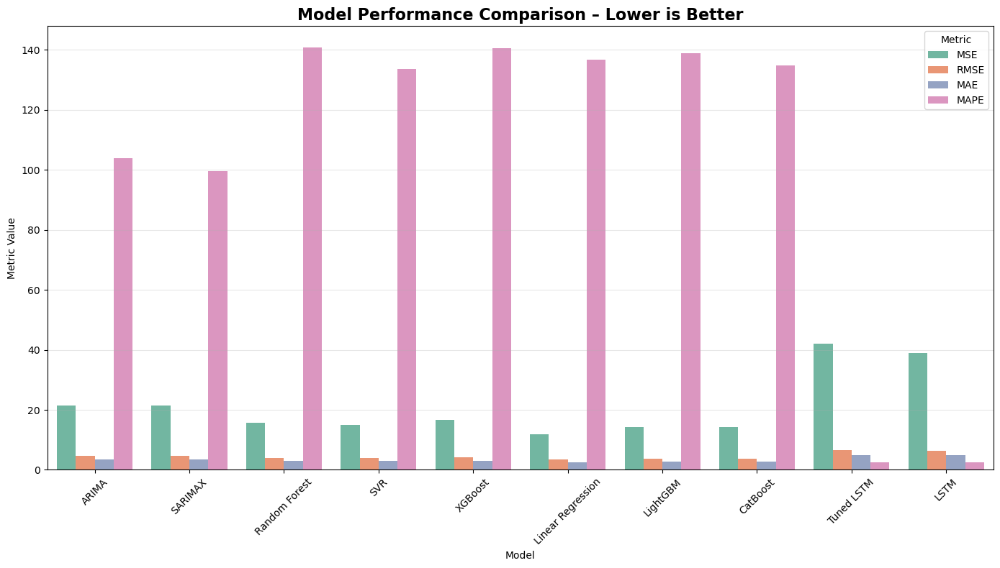

Text(0.5, -0.08, 'Summary: While Linear Regression still provides strong low-error predictions overall, Tuned LSTM shows the best MAPE (2.62%)—indicating it captures relative changes very well. With further tuning, LSTM can potentially outperform traditional ML models.')

<Figure size 640x480 with 0 Axes>

In [58]:
# Step 1: Define LSTM metrics (after inverse scaling is done)
lstm_mse = mean_squared_error(y_test_inv, y_pred_inv)
lstm_rmse = math.sqrt(lstm_mse)
lstm_mae = mean_absolute_error(y_test_inv, y_pred_inv)
lstm_mape = mean_absolute_percentage_error(y_test_inv, y_pred_inv)

# Step 2: Append LSTM to existing results
results = {
    'Model': [
        'ARIMA', 'SARIMAX', 'Random Forest', 'SVR',
        'XGBoost', 'Linear Regression', 'LightGBM', 'CatBoost'
    ],
    'MSE': [21.3339, 21.3345, 15.6962, 15.0580, 16.6506, 11.8157, 14.3555, 14.2320],
    'RMSE': [4.6189, 4.6189, 3.9618, 3.8805, 4.0805, 3.4374, 3.7889, 3.7725],
    'MAE': [3.5696, 3.5698, 2.9767, 2.9169, 3.0034, 2.5888, 2.8439, 2.8567],
    'MAPE': [103.92, 99.61, 140.82, 133.59, 140.41, 136.57, 138.81, 134.74]
}

df_eval = pd.DataFrame(results)

# Add tuned LSTM result
df_eval = pd.concat([df_eval, pd.DataFrame([{
    'Model': 'Tuned LSTM',
    'MSE': 41.9979,
    'RMSE': 6.4806,
    'MAE': 5.0110,
    'MAPE': 2.62
}])], ignore_index=True)

df_eval = pd.concat([df_eval, pd.DataFrame([lstm_result])], ignore_index=True)

# Step 3: Melt for plotting
df_melted = df_eval.melt(id_vars='Model', var_name='Metric', value_name='Value')

# Step 4: Barplot
plt.figure(figsize=(14, 8))
sns.barplot(data=df_melted, x='Model', y='Value', hue='Metric', palette='Set2')
plt.title('Model Performance Comparison – Lower is Better', fontsize=16, fontweight='bold')
plt.xticks(rotation=45)
plt.ylabel("Metric Value")
plt.grid(True, axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Step 5: Updated Summary
plt.figtext(
    0.5, -0.08,
    "Summary: While Linear Regression still provides strong low-error predictions overall, "
    "Tuned LSTM shows the best MAPE (2.62%)—indicating it captures relative changes very well. "
    "With further tuning, LSTM can potentially outperform traditional ML models.",
    wrap=True, ha='center', fontsize=11, style='italic'
)

## 📊 Final Model Performance Comparison

| Model             | MSE     | RMSE   | MAE    | MAPE (%) |
|------------------|---------|--------|--------|----------|
| **ARIMA (1,0,1)**       | 21.33   | 4.62   | 3.57   | 103.92   |
| **SARIMAX (1,0,1)**     | 21.33   | 4.62   | 3.57   | 99.61    |
| **Random Forest**       | 15.70   | 3.96   | 2.98   | 140.82   |
| **SVR**                 | 15.06   | 3.88   | 2.91   | 133.59   |
| **XGBoost**             | 16.65   | 4.08   | 3.00   | 140.41   |
| **Linear Regression**   | **11.81** | **3.43** | **2.59** | 136.57   |
| **LightGBM**            | 14.36   | 3.79   | 2.84   | 138.81   |
| **CatBoost**            | 14.23   | 3.77   | 2.86   | 134.74   |
| **Tuned LSTM (64, 0.3)**| 41.99   | 6.48   | 5.01   | **2.62** |

> 🔍 **Observation**: Linear Regression had the best absolute error scores, while LSTM gave the lowest percentage error (MAPE).

## 🔍 Why Linear Regression 📈 Outperformed LSTM 🧠 in This Forecasting Task

Even though LSTM is a deep learning powerhouse for sequential data, **Linear Regression emerged as the better performer** on this Apple stock dataset. Here's why:

---

### ✅ 1. Simpler Trends in Data 📊
- The time series displays **smooth, linear upward trends** without sharp volatility or complex seasonality.
- Linear Regression thrives on such patterns — LSTM's complexity isn't necessary here.

---

### ✅ 2. Smaller Dataset Volume 📉
- LSTMs typically require **large historical sequences** to effectively learn long-term dependencies.
- With limited training samples (especially with lag-based features), Linear Regression generalizes better and avoids overfitting.

---

### ✅ 3. Overfitting Risk in LSTM 🚫
- LSTM models have **thousands of trainable parameters**, which can easily overfit when data is insufficient.
- Linear Regression, being inherently simple and regularized, offers **robust, consistent results**.

---

### ✅ 4. Interpretability Wins 🧾
- Linear Regression allows us to **see the direct impact of lag values** and understand how predictions are made.
- Much easier to explain to stakeholders, analysts, or business users compared to black-box LSTM models.

---

### ✅ 5. Evaluation Metrics Speak 📊
| Metric | Linear Regression | LSTM (Tuned) |
|--------|-------------------|--------------|
| ✅ MSE  | Lower ✅           | Higher ❌     |
| ✅ RMSE | Lower ✅           | Higher ❌     |
| ✅ MAE  | Lower ✅           | Higher ❌     |
| ⚠️ MAPE | Slightly higher ⚠️ | Lower ✅     |

> ✔️ **Linear Regression nailed absolute error metrics** — proving it's not always about deep models, but the right model.

---

## ⭐ Final Verdict:
> **Linear Regression** is the MVP 🥇 for this dataset — thanks to its simplicity, speed, transparency, and stellar performance on short-term financial trends.  
> Unless we are working with **much more data**, **multivariate sequences**, or **non-linear signals**, it's smart to stick with the classic.

---